In [1]:
from IPython.display import HTML
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

In [2]:
import pandas as pd
import numpy as np
from scipy import stats
import pickle

import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb

np.set_printoptions(linewidth=np.inf, suppress=True, precision=2)

/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [3]:
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score 

from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

import tensorflow as tf

from sklearn.gaussian_process.kernels import (RBF, Matern, RationalQuadratic,ExpSineSquared, DotProduct,ConstantKernel)
from sklearn.gaussian_process import GaussianProcessRegressor  
from sklearn.svm import SVR

In [4]:
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

pyo.init_notebook_mode(connected=True)

In [5]:
from solver import deasolver

In [6]:
results = []
df_imp = pd.DataFrame()

In [9]:
df = pd.read_excel("Data/RealData/Recurcive/egrid2020_data.xlsx", index_col = 0)

In [21]:
def ml(df=df, sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_0.xlsx", i=None):
    
    df_sol = pd.read_excel(sol_filepath, index_col = 0)[['Efficiency_Scores']]
    df_weights = pd.read_excel(sol_filepath, index_col = 0).iloc[:, 1:]
    
    df_zero = (df_weights==0).sum()
    print("df_zero: \n", df_zero)
    
    total_zeros = (df_weights==0).sum().sum()
    print("Total Zeros: ", total_zeros)
    
    plt.figure(figsize=(18,12))
    sns.heatmap(df_weights.eq(0).transpose(),
            cmap="YlGnBu",
            cbar=False,
            cbar_kws={'label': 'Zero Values'});
    
    X = df
    y = df_sol
    
    std_scaler = StandardScaler()
    mm_scaler = MinMaxScaler()
    
    gb_model = GradientBoostingRegressor(random_state=42)

    pipe_gb = make_pipeline(std_scaler, gb_model)

    # cross-validate the pipeline
    print("neg_mean_squared_error:", cross_val_score(pipe_gb, X, y.values.ravel(), scoring="neg_mean_squared_error").mean())
    print("neg_root_mean_squared_error:", cross_val_score(pipe_gb, X, y.values.ravel(), scoring="neg_root_mean_squared_error").mean())
    print("r2:", cross_val_score(pipe_gb, X, y.values.ravel(), scoring="r2").mean())
    
    learning_rate = [1, 0.5, 0.1,  0.01]
    n_estimators = [50, 100, 200, 500, 1000, 2000]
    max_depth = [3, 5, 10, None]
    # Minimum number of samples required to split a node
    min_samples_split = [2, 5, 10, 20, 30]
    # Minimum number of samples required at each leaf node
    min_samples_leaf = [1, 2, 4]
    subsample = [0.3, 0.5, 0.75, 1.0]
    
    # specify parameter values to search
    params = {}
    params['gradientboostingregressor__learning_rate'] = learning_rate
    params['gradientboostingregressor__n_estimators'] = n_estimators
    params['gradientboostingregressor__max_depth'] = max_depth
    params['gradientboostingregressor__min_samples_split'] = min_samples_split
    params['gradientboostingregressor__min_samples_leaf'] = min_samples_leaf
    params['gradientboostingregressor__subsample'] = subsample
    
    grid = RandomizedSearchCV(pipe_gb, params, cv=5, scoring="neg_root_mean_squared_error", random_state=0)
    grid.fit(X, y.values.ravel())
    
    print("grid.best_score: ", grid.best_score_)
    print("grid.best_params: ", grid.best_params_)
    print("grid.best_estimator: ", grid.best_estimator_)
    print("grid.r2: ", cross_val_score(grid.best_estimator_, X, y.values.ravel(), scoring="r2").mean())
    
    imp_gb = grid.best_estimator_.steps[1][1].feature_importances_
    df_gb = pd.DataFrame({"Feature Name":X.columns, "Importance": imp_gb}).sort_values("Importance", ascending=False)
    input_imp = list(df_gb.loc[df_gb["Feature Name"].str.contains("Input"), "Feature Name"].values)
    results = (i,
                grid.best_estimator_.steps[1][0], input_imp,
                {"r2" : cross_val_score(grid.best_estimator_, X, y.values.ravel(), scoring="r2").mean(),
                "neg_root_mean_squared_error": grid.best_score_,
               "total_zeros": total_zeros},
              )
    
    fig = px.bar(df_gb, x="Importance", y="Feature Name")

    fig.update_layout(
        autosize=False,
        width=800,
        height=500,
        title_text=f"GradientBoostingRegressor Feature Importances",
        yaxis={'categoryorder':'total ascending'}
    )

    fig.show()
    
    df_zero.index = [f.split('_',1)[1] for f in df_zero.index]
    
    df_merged = pd.merge(df_gb, df_zero.reset_index(), left_on='Feature Name', right_on='index')
    df_merged.rename(columns = {0: "Zero_Count"}, inplace=True)
    
    df_merged["Iteration"] = i
    
    fig = px.scatter(df_merged[~df_merged["Feature Name"].str.contains("Output")], x="Zero_Count", y="Importance",
                hover_data=["Feature Name"])

    fig.update_layout(
        autosize=False,
        width=800,
        height=500,
        title_text=f"GradientBoostingRegressor Feature Importance - Zero_Count Relationship",
    )

    fig.show()
    
    return pipe_gb, results, y, df_merged

In [11]:
def plotScatter(res_gb, x, y, colorCol, blueCount, redCount):

    fig = px.scatter(res_gb, x=x, y=y, color = colorCol, color_discrete_map= {True:"blue", False: "red"},
                     hover_data=[x, y, colorCol] + [res_gb.index])


    fig.add_traces(
        list(px.line(x = np.linspace(0.3, 1, num=2), y = np.linspace(0.3, 1, num=2)).select_traces())
    )

    fig.update_traces(line_color='lightgreen', line_width=3)

    fig.update_layout(
        autosize=False,
        width=800,
        height=500,
        title_text=f"Efficiency Scores Comparison (Blue: {blueCount}, Red: {redCount})",
    )

    fig.show()

In [12]:
def compareML(pipe_gb, y, X=df, err_thresh = 3):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = pipe_gb.fit(X_train, y_train.values.ravel())
    prediction = model.predict(X_test)
    
    res = pd.DataFrame()
    res["Prediction"] = pd.Series(prediction.ravel())
    res["Actual"] = y_test.values
    res["Diff"] = res.Prediction - res.Actual
    res["Error_Perc"] = ((res.Prediction - res.Actual) / res.Actual) * 100 
    res[f"Error_Perc < {err_thresh}"] = np.abs(res["Error_Perc"]) < err_thresh  
    res = res.round(4)
    print("res: ", res)
    
    blue = res[f"Error_Perc < {err_thresh}"].sum()
    print("blue: ", blue)
    red = len(res[f"Error_Perc < {err_thresh}"]) - (res[f"Error_Perc < {err_thresh}"].sum())
    print("red: ", red)
    
    rho, p = stats.spearmanr(res.Prediction, res.Actual)
    print("rho:", rho.round(4)) 
    print("p-Value", p.round(4)) 
    
    plotScatter(res, x="Actual", y="Prediction", colorCol=f"Error_Perc < {err_thresh}",
               blueCount=blue, redCount=red)

In [14]:
def compareES(df_1_path=None, df_0_path=None, df_basic_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_0.xlsx", err_thresh = 10):
    
    df_basic = pd.read_excel(df_basic_path, index_col=0)
    df_1 = pd.read_excel(df_1_path, index_col=0)
    
    res_gb = pd.DataFrame()
    res_gb["Efficiency_Scores_Basic"] = df_basic["Efficiency_Scores"]
    res_gb["Efficiency_Scores_ML"] = df_1["Efficiency_Scores"]

    
    res_gb["Diff_Basic"] = res_gb["Efficiency_Scores_Basic"]  - res_gb["Efficiency_Scores_ML"]
    res_gb["Diff_Basic_Perc"] = (res_gb["Diff_Basic"] / res_gb["Efficiency_Scores_Basic"]) * 100 
    res_gb[f"Diff_Basic_Perc < {err_thresh}"] = np.abs(res_gb["Diff_Basic_Perc"]) < err_thresh
    
    res_gb["Diff_Basic"] = res_gb["Efficiency_Scores_Basic"]  - res_gb["Efficiency_Scores_ML"]
    res_gb["Diff_Basic_Perc"] = (res_gb["Diff_Basic"] / res_gb["Efficiency_Scores_Basic"]) * 100 
    res_gb[f"Diff_Basic_Perc < {err_thresh}"] = np.abs(res_gb["Diff_Basic_Perc"]) < err_thresh
    
    blue = res_gb[f"Diff_Basic_Perc < {err_thresh}"].sum()
    print("blue : ", blue)
    red = len(res_gb[f"Diff_Basic_Perc < {err_thresh}"]) - (res_gb[f"Diff_Basic_Perc < {err_thresh}"].sum())
    print("red : ", red)
    
    res_gb = res_gb.round(4)
    
    plotScatter(res_gb, x="Efficiency_Scores_Basic", y="Efficiency_Scores_ML", colorCol=f"Diff_Basic_Perc < {err_thresh}",
               blueCount=blue, redCount=red)
       
    if df_0_path:
        
        df_0 = pd.read_excel(df_0_path, index_col=0)
        res_gb["Efficiency_Scores_ML_Pr"] = df_0["Efficiency_Scores"]
        
        res_gb["Diff_Previous"] = res_gb["Efficiency_Scores_ML_Pr"]  - res_gb["Efficiency_Scores_ML"]
        res_gb["Diff_Previous_Perc"] = (res_gb["Diff_Previous"] / res_gb["Efficiency_Scores_ML_Pr"]) * 100 
        res_gb[f"Diff_Previous_Perc < {err_thresh}"] = np.abs(res_gb["Diff_Previous_Perc"]) < err_thresh
        
        blue = res_gb[f"Diff_Previous_Perc < {err_thresh}"].sum()
        print("blue : ", blue)
        red = len(res_gb[f"Diff_Previous_Perc < {err_thresh}"]) - (res_gb[f"Diff_Previous_Perc < {err_thresh}"].sum())
        print("red : ", red)
        
        #res_gb = res_gb.round(4)
        
        plotScatter(res_gb, x="Efficiency_Scores_ML_Pr", y="Efficiency_Scores_ML", colorCol=f"Diff_Previous_Perc < {err_thresh}",
               blueCount=blue, redCount=red)


### i=0

In [15]:
i=0

In [16]:
deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx", folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_" + str(i))

Restricted license - for non-production use only - expires 2023-10-25


Restricted license - for non-production use only - expires 2023-10-25


100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     1065
Weight_Input_Plant annual CH4 emissions (lbs)         1677
Weight_Input_Plant annual CO2 emissions (tons)         982
Weight_Input_Plant annual N2O emissions (lbs)           16
Weight_Input_Plant annual NOx emissions (tons)         721
Weight_Input_Plant annual SO2 emissions (tons)        1219
Weight_Input_Plant nameplate capacity (MW)            1153
Weight_Input_Plant total annual heat input (MMBtu)    1196
Weight_Output_Plant annual net generation (MWh)          0
dtype: int64
Total Zeros:  8029
neg_mean_squared_error: -0.006195814168500078
neg_root_mean_squared_error: -0.07775279587987372
r2: 0.8127089658082163
grid.best_score:  -0.06212434603981618
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientb

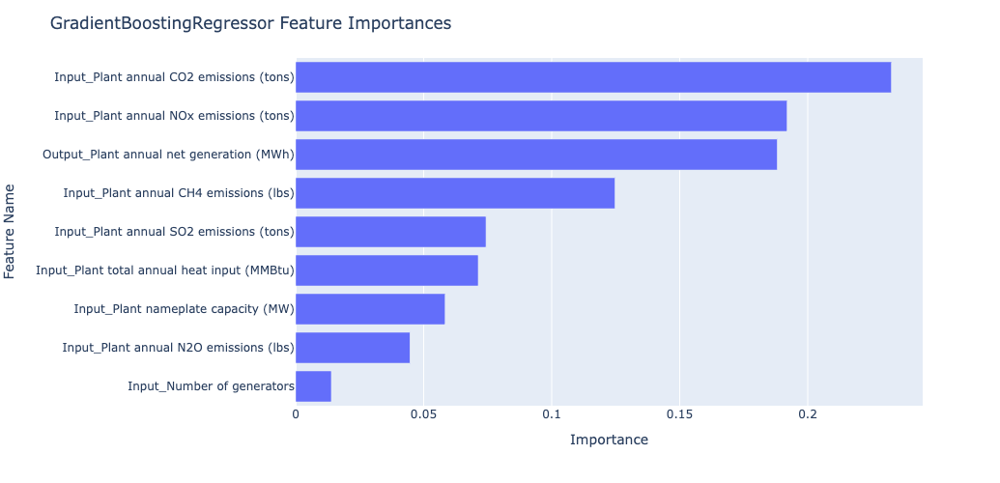

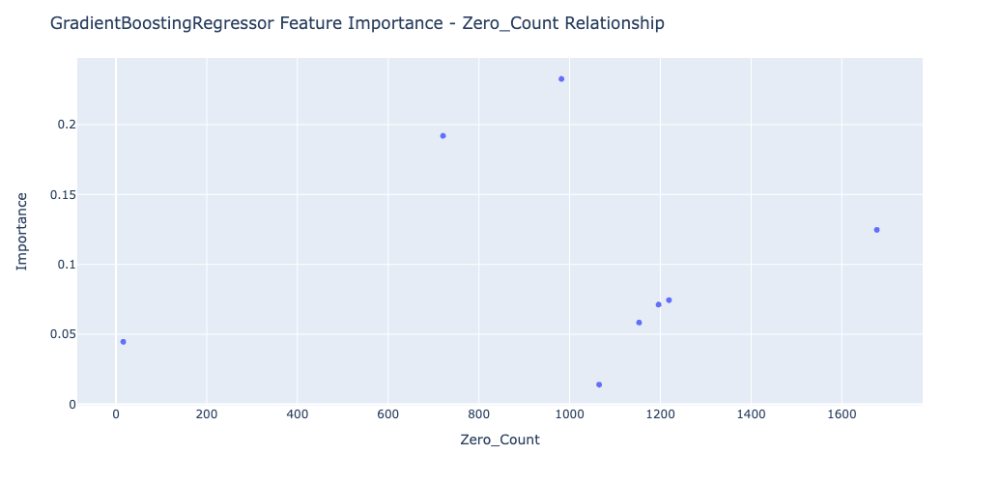

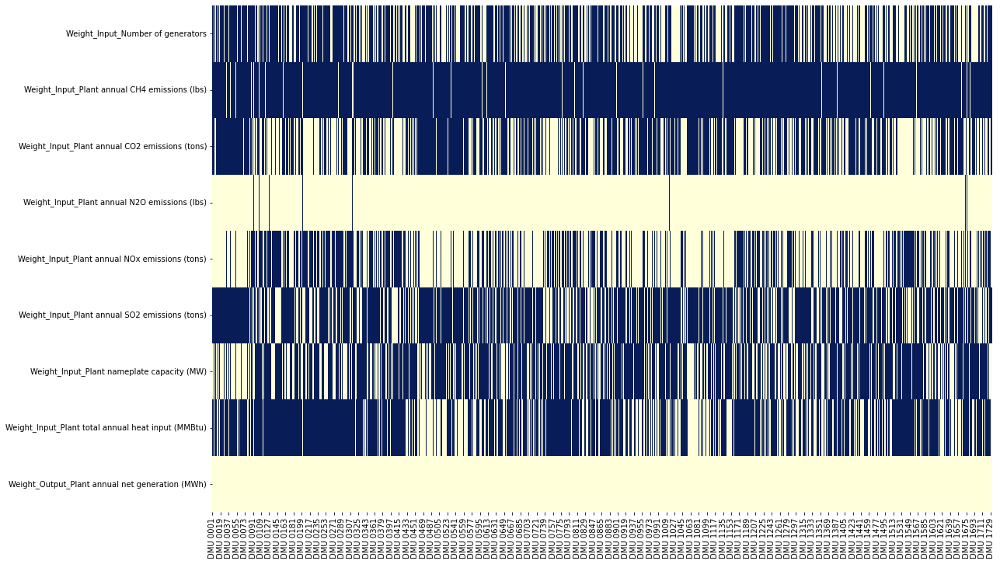

In [23]:
pipe_gb, r, y, df_merged = ml(i=i)
results.append(r)

In [27]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.5219  0.5435 -0.0217     -3.9850           False
1        0.4842  0.4909 -0.0067     -1.3651            True
2        0.2169  0.2257 -0.0088     -3.9047           False
3        0.5496  0.5522 -0.0026     -0.4669            True
4        0.3790  0.4459 -0.0669    -15.0036           False
..          ...     ...     ...         ...             ...
342      0.4907  0.5205 -0.0298     -5.7294           False
343      0.2524  0.2733 -0.0209     -7.6642           False
344      0.3826  0.3532  0.0294      8.3381           False
345      0.4627  0.4911 -0.0283     -5.7714           False
346      0.4474  0.4509 -0.0036     -0.7958            True

[347 rows x 5 columns]
blue:  88
red:  259
rho: 0.945
p-Value 0.0


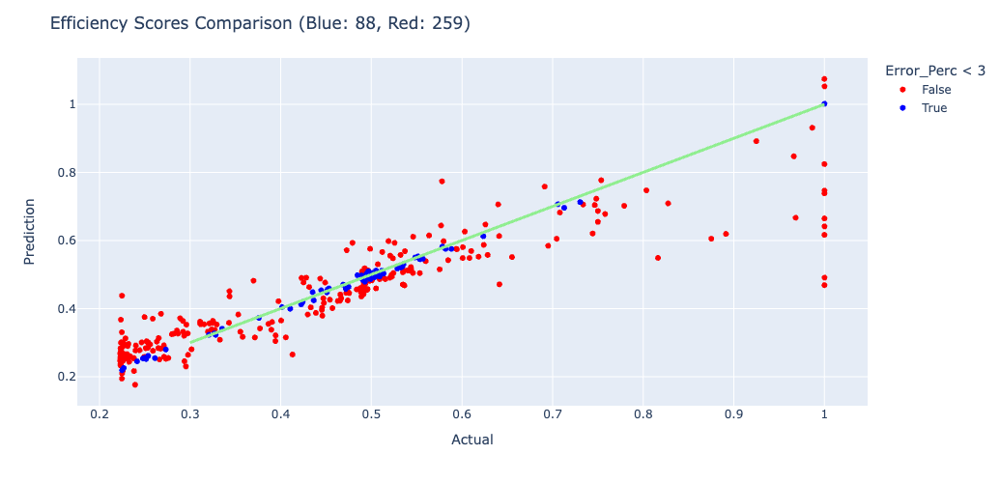

In [28]:
compareML(pipe_gb, y)

### i = 1

In [29]:
i +=1

In [32]:
for r in results[-1:]:
    deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx",  folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     201
Weight_Input_Plant annual CH4 emissions (lbs)         199
Weight_Input_Plant annual CO2 emissions (tons)          0
Weight_Input_Plant annual N2O emissions (lbs)         201
Weight_Input_Plant annual NOx emissions (tons)          9
Weight_Input_Plant annual SO2 emissions (tons)        200
Weight_Input_Plant nameplate capacity (MW)            201
Weight_Input_Plant total annual heat input (MMBtu)    200
Weight_Output_Plant annual net generation (MWh)         0
dtype: int64
Total Zeros:  1211
neg_mean_squared_error: -0.0026795463261384224
neg_root_mean_squared_error: -0.05027579427296389
r2: 0.45432287853634373
grid.best_score:  -0.04789365699889571
grid.best_params:  {'gradientboostingregressor__subsample': 1.0, 'gradientboostingregressor__n_estimators': 200, 'gradientboostingregressor__min_samples_split': 2, 'gradientboostingregressor__min_samples_leaf': 4, 'gradientboostingregressor__max_depth': 5, 'gradientboostingr

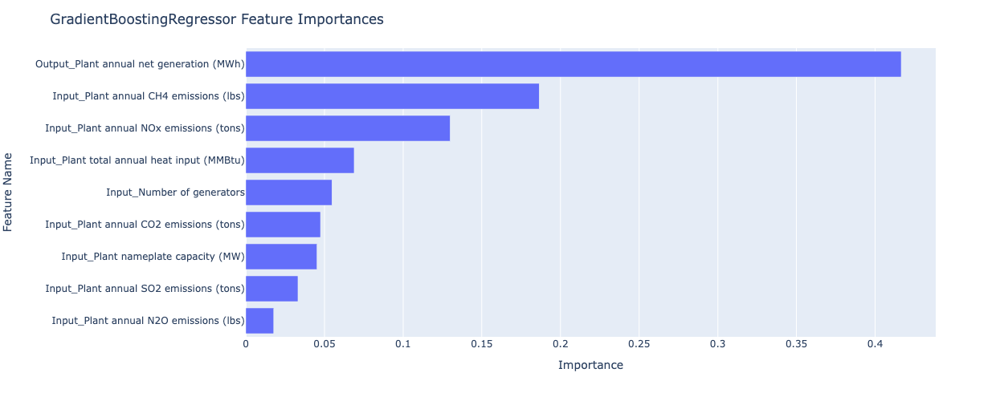

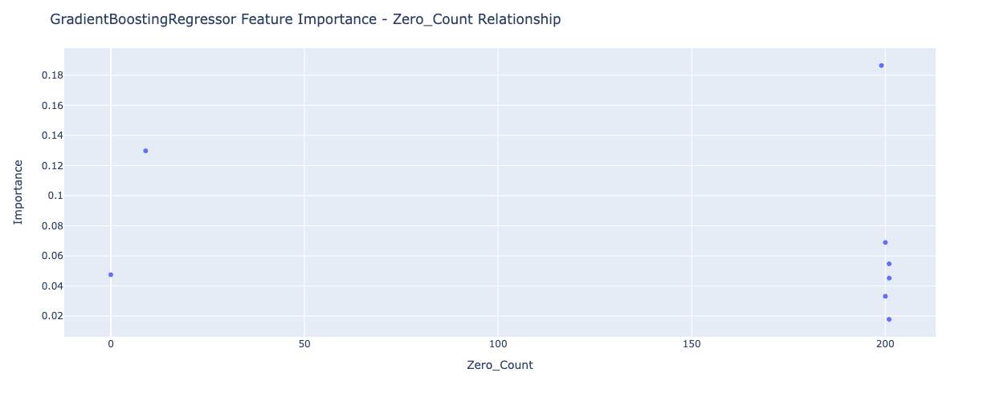

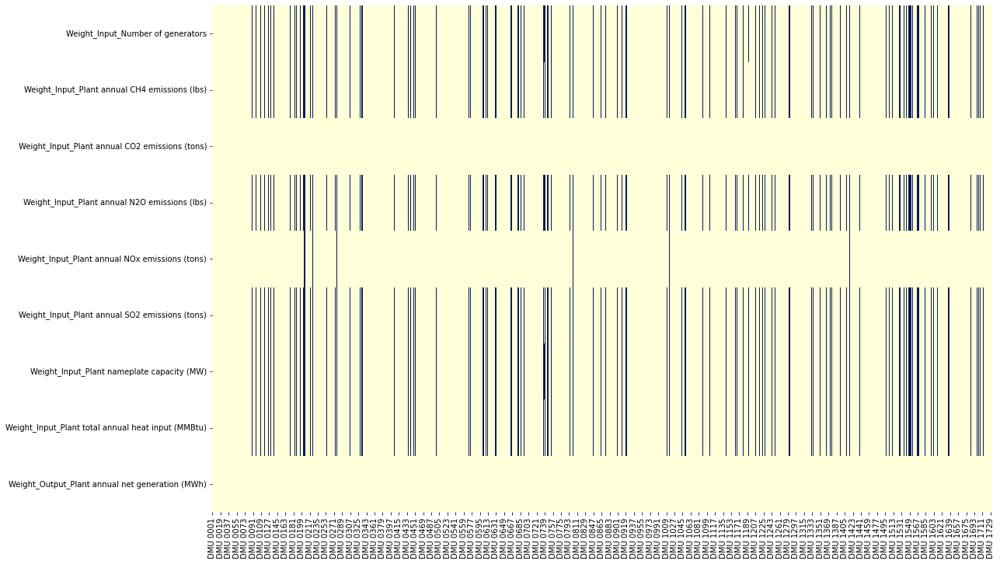

In [34]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_1.xlsx", i=i)
results.append(r)

In [35]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.0121  0.0132 -0.0011     -8.4814           False
1        0.0136  0.0133  0.0003      2.2755            True
2        0.0217  0.0225 -0.0008     -3.6548           False
3        0.0123  0.0079  0.0044     55.8056           False
4        0.0101  0.0033  0.0068    204.3692           False
..          ...     ...     ...         ...             ...
342      0.0264  0.0244  0.0020      8.1190           False
343      0.0212  0.0230 -0.0018     -7.6678           False
344      0.0273  0.0287 -0.0014     -4.9653           False
345      0.0138  0.0132  0.0006      4.8959           False
346      0.0334  0.0389 -0.0055    -14.0637           False

[347 rows x 5 columns]
blue:  76
red:  271
rho: 0.8414
p-Value 0.0


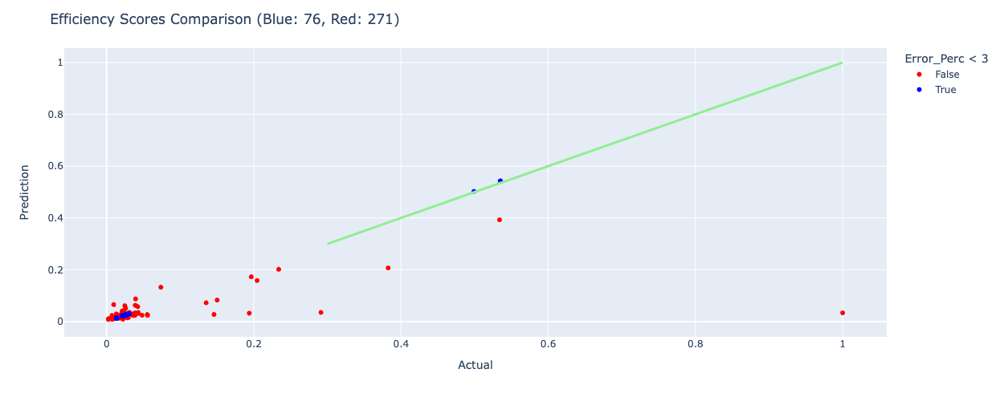

In [36]:
compareML(pipe_gb, y)

blue :  3
red :  1730


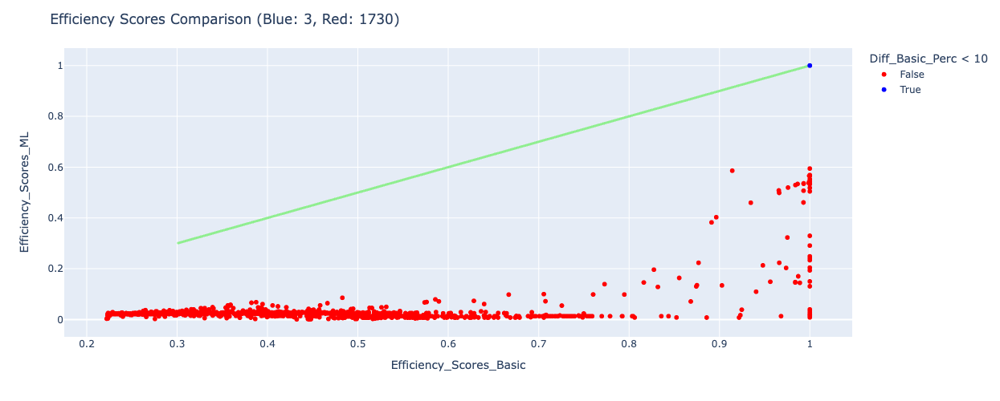

In [37]:
compareES(df_1_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_1.xlsx")

### i = 2

In [38]:
i +=1

In [39]:
for r in results[-1:]:
    deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx",  folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     2
Weight_Input_Plant annual CH4 emissions (lbs)         0
Weight_Input_Plant annual CO2 emissions (tons)        2
Weight_Input_Plant annual N2O emissions (lbs)         2
Weight_Input_Plant annual NOx emissions (tons)        0
Weight_Input_Plant annual SO2 emissions (tons)        2
Weight_Input_Plant nameplate capacity (MW)            2
Weight_Input_Plant total annual heat input (MMBtu)    2
Weight_Output_Plant annual net generation (MWh)       0
dtype: int64
Total Zeros:  12
neg_mean_squared_error: -0.0027690464936856894
neg_root_mean_squared_error: -0.04712415653941325
r2: 0.5981940987707582
grid.best_score:  -0.04454433666531549
grid.best_params:  {'gradientboostingregressor__subsample': 1.0, 'gradientboostingregressor__n_estimators': 200, 'gradientboostingregressor__min_samples_split': 10, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingregressor__learning_r

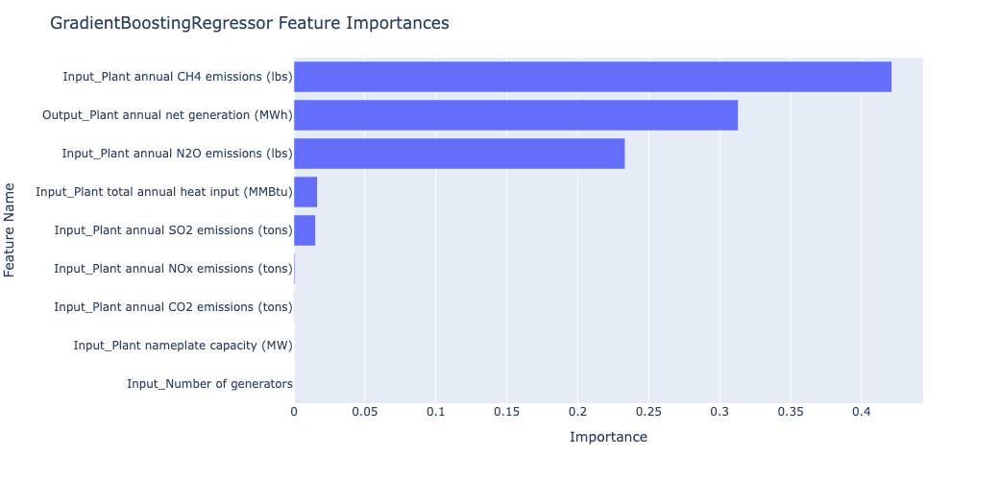

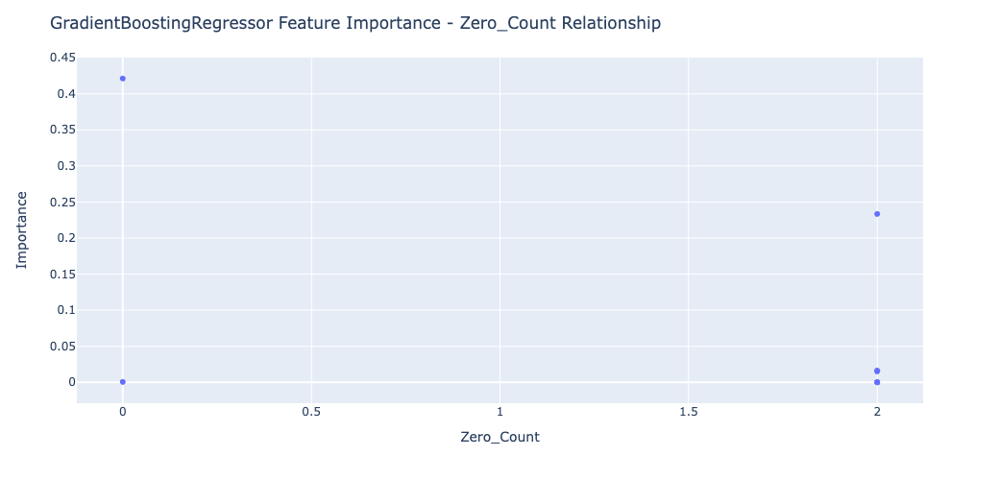

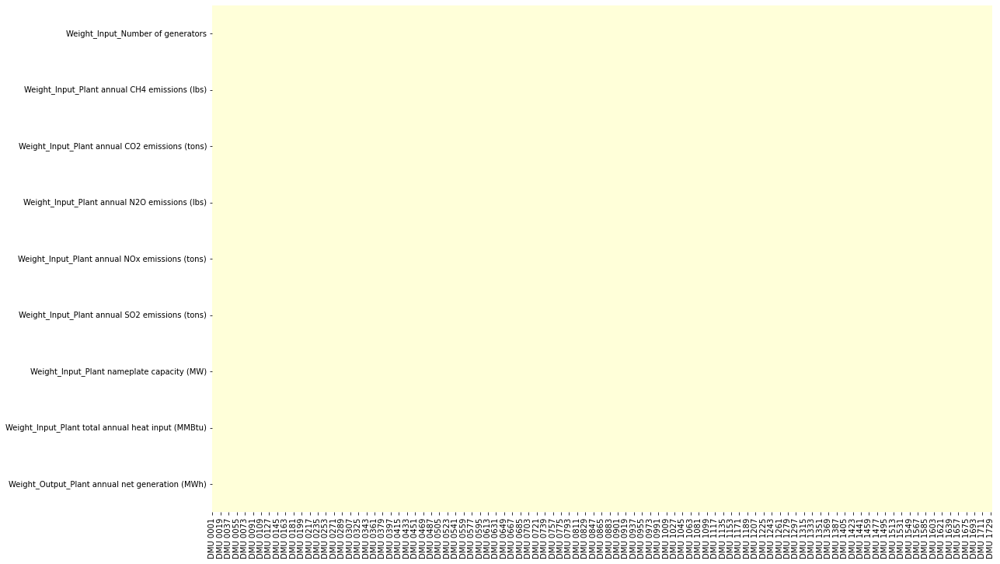

In [40]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_2.xlsx", i=i)
results.append(r)

In [41]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.0091  0.0105 -0.0014    -13.4709           False
1        0.0096  0.0104 -0.0009     -8.5231           False
2        0.0031  0.0024  0.0007     28.2990           False
3        0.0085  0.0106 -0.0021    -19.9300           False
4        0.0097  0.0029  0.0068    235.8979           False
..          ...     ...     ...         ...             ...
342      0.0030  0.0024  0.0006     27.6102           False
343      0.0035  0.0040 -0.0006    -13.8122           False
344      0.0030  0.0027  0.0003     12.6709           False
345      0.0096  0.0104 -0.0009     -8.3365           False
346      0.0024  0.0031 -0.0007    -23.9392           False

[347 rows x 5 columns]
blue:  58
red:  289
rho: 0.7739
p-Value 0.0


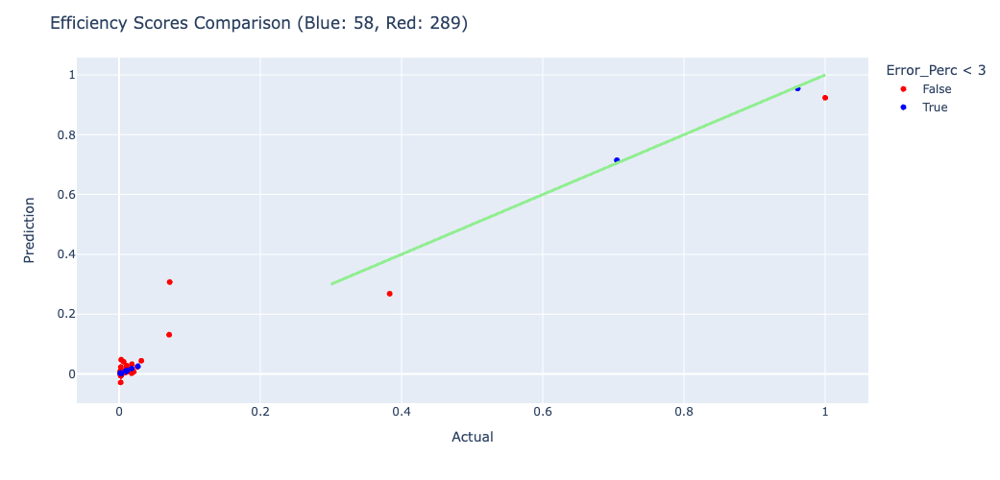

In [42]:
compareML(pipe_gb, y)

blue :  11
red :  1722


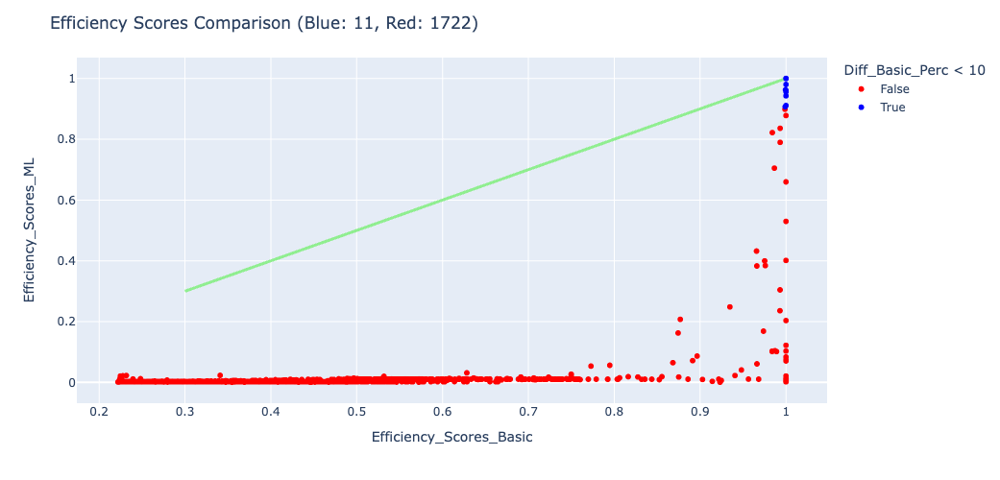

blue :  40
red :  1693


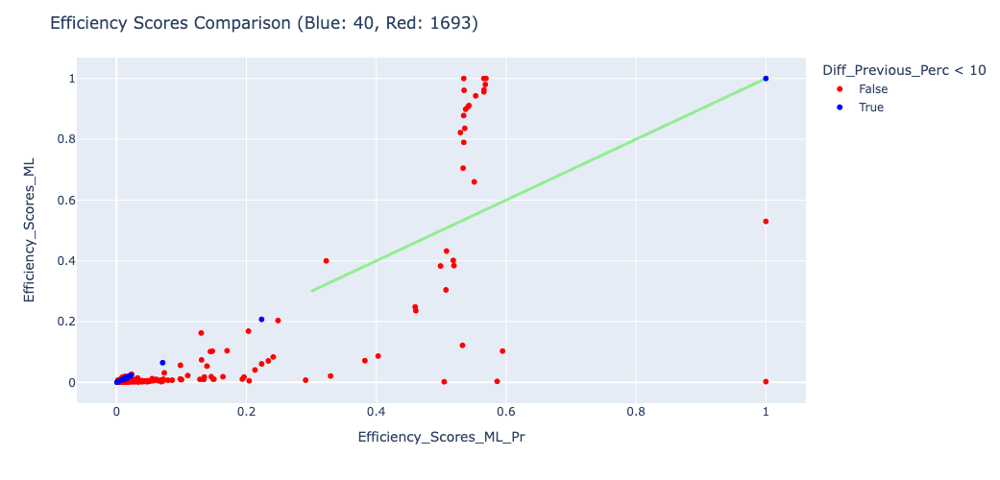

In [43]:
compareES(df_1_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_2.xlsx", df_0_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_1.xlsx")

### i = 3

In [44]:
i +=1

In [45]:
for r in results[-1:]:
    deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx",  folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     264
Weight_Input_Plant annual CH4 emissions (lbs)           0
Weight_Input_Plant annual CO2 emissions (tons)        221
Weight_Input_Plant annual N2O emissions (lbs)           0
Weight_Input_Plant annual NOx emissions (tons)        158
Weight_Input_Plant annual SO2 emissions (tons)        140
Weight_Input_Plant nameplate capacity (MW)            236
Weight_Input_Plant total annual heat input (MMBtu)     29
Weight_Output_Plant annual net generation (MWh)         0
dtype: int64
Total Zeros:  1048
neg_mean_squared_error: -0.003277636297963962
neg_root_mean_squared_error: -0.055251324654830694
r2: 0.8384347023037583
grid.best_score:  -0.0580673184917051
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingre

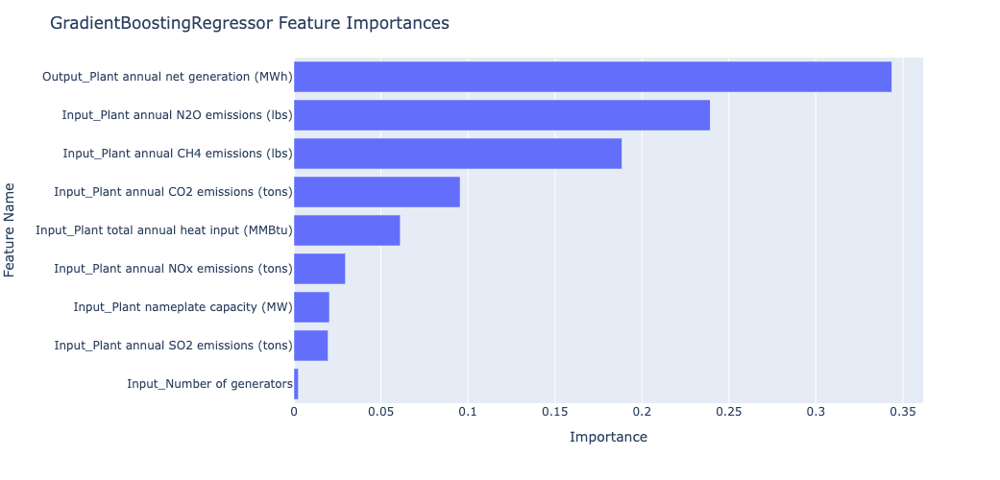

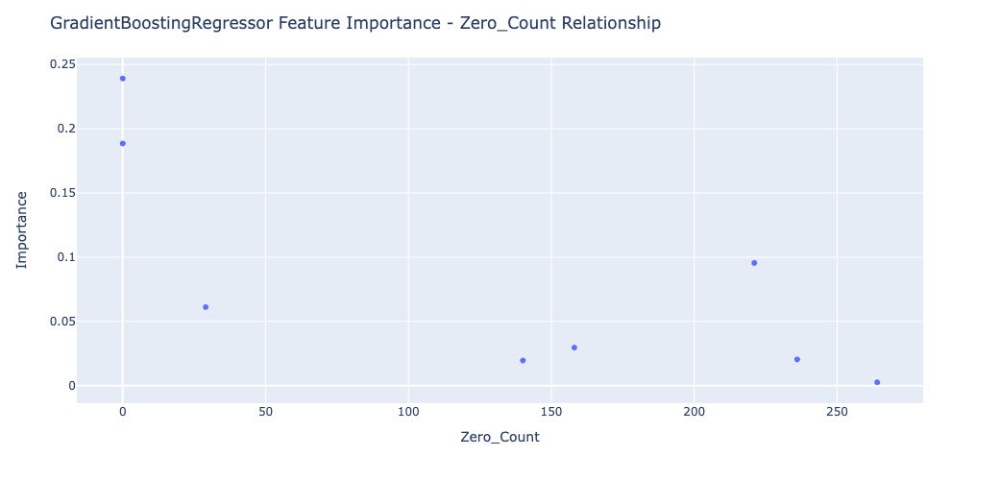

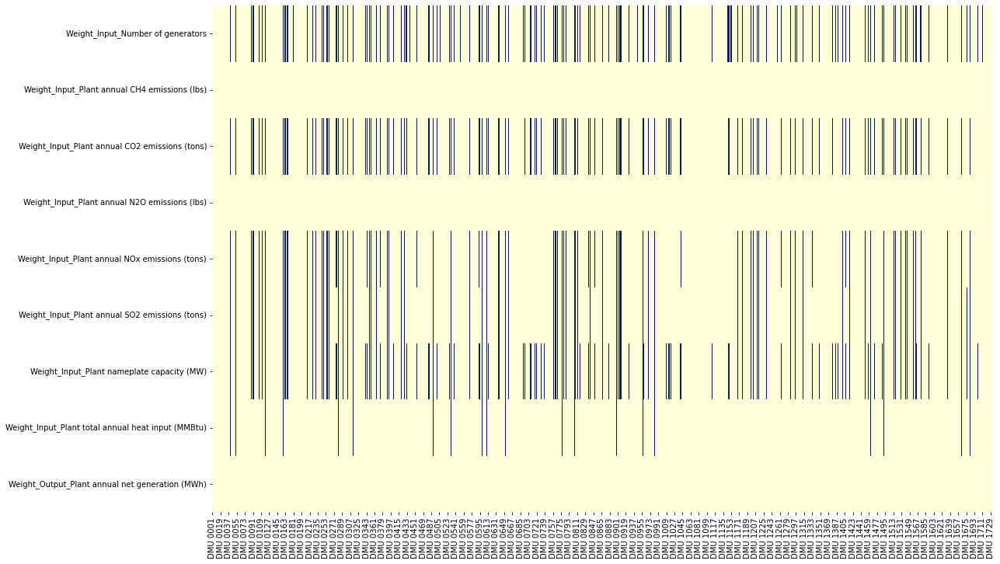

In [46]:
pipe_gb, r, y,df_merged = ml(sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_3.xlsx", i=i)
results.append(r)

In [47]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.1267  0.1321 -0.0054     -4.0607           False
1        0.1280  0.1314 -0.0034     -2.6024            True
2        0.0284  0.0268  0.0016      5.8048           False
3        0.1218  0.1327 -0.0108     -8.1770           False
4        0.0701  0.0421  0.0280     66.4821           False
..          ...     ...     ...         ...             ...
342      0.0286  0.0264  0.0022      8.3270           False
343      0.0256  0.0410 -0.0155    -37.7501           False
344      0.0257  0.0298 -0.0041    -13.9229           False
345      0.1240  0.1314 -0.0073     -5.5811           False
346      0.0284  0.0345 -0.0061    -17.6692           False

[347 rows x 5 columns]
blue:  64
red:  283
rho: 0.7949
p-Value 0.0


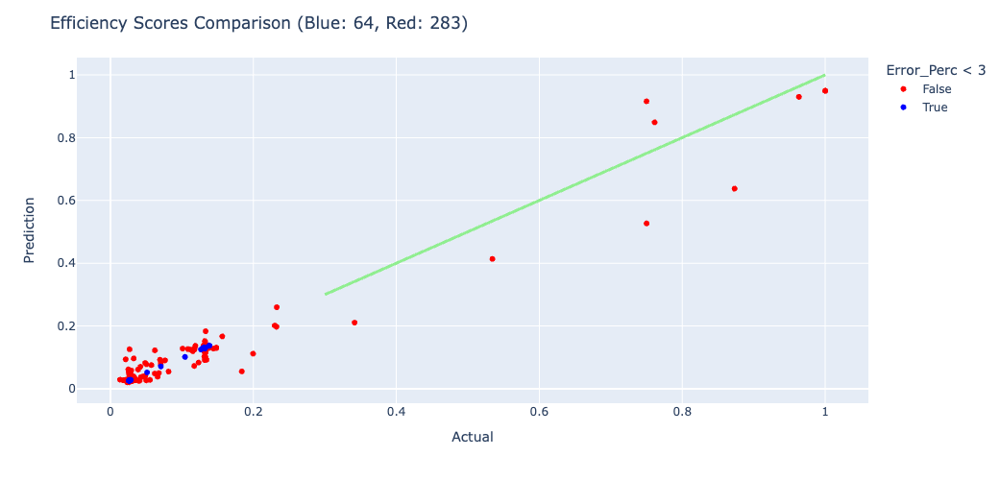

In [48]:
compareML(pipe_gb, y)

blue :  35
red :  1698


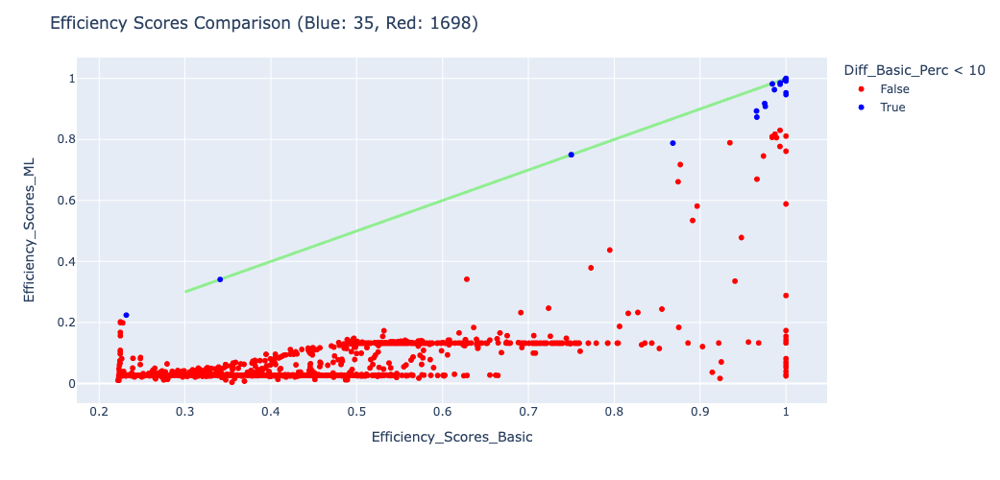

blue :  11
red :  1722


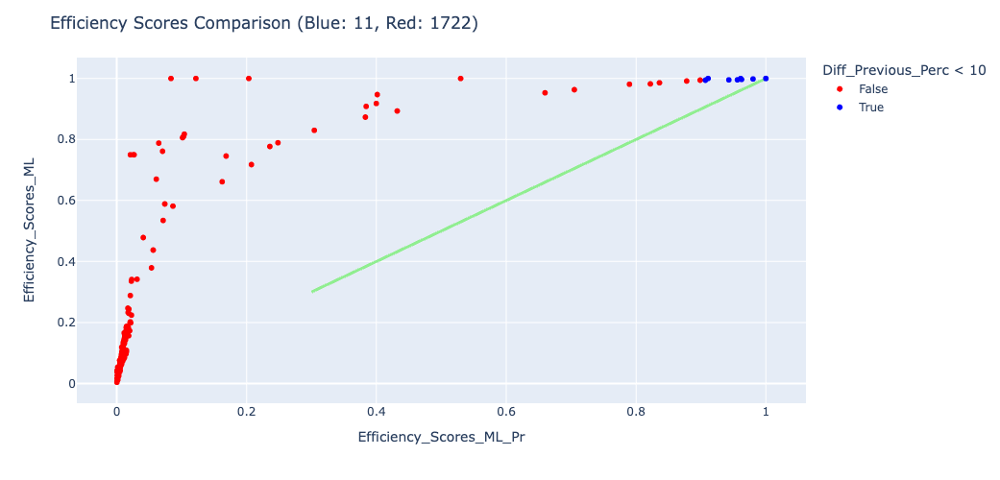

In [49]:
compareES(df_1_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_3.xlsx", df_0_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_2.xlsx")

### i = 4

In [50]:
i +=1

In [51]:
for r in results[-1:]:
    deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx",  folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     1065
Weight_Input_Plant annual CH4 emissions (lbs)          775
Weight_Input_Plant annual CO2 emissions (tons)         802
Weight_Input_Plant annual N2O emissions (lbs)            0
Weight_Input_Plant annual NOx emissions (tons)          86
Weight_Input_Plant annual SO2 emissions (tons)        1032
Weight_Input_Plant nameplate capacity (MW)             837
Weight_Input_Plant total annual heat input (MMBtu)      90
Weight_Output_Plant annual net generation (MWh)          0
dtype: int64
Total Zeros:  4687
neg_mean_squared_error: -0.003448888324919084
neg_root_mean_squared_error: -0.05694610296157806
r2: 0.8588070247731571
grid.best_score:  -0.05257791838945207
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientb

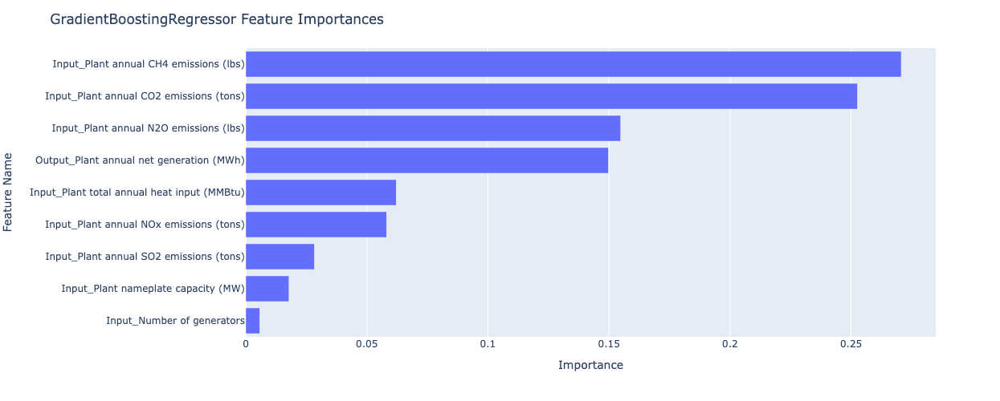

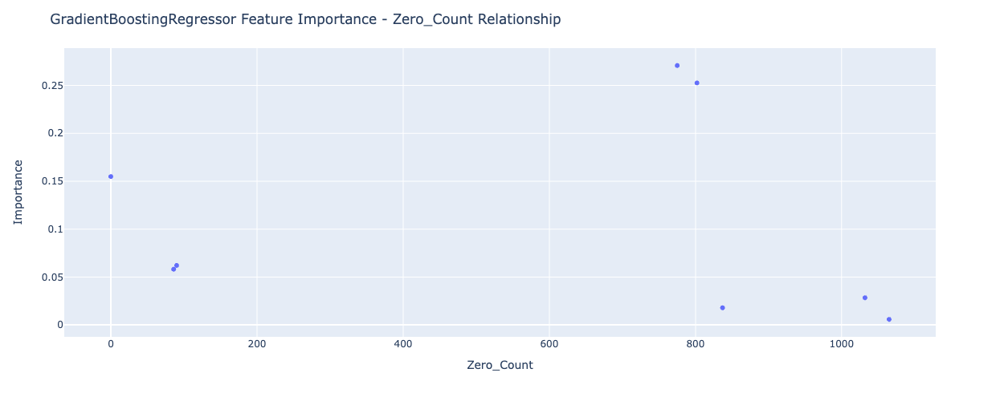

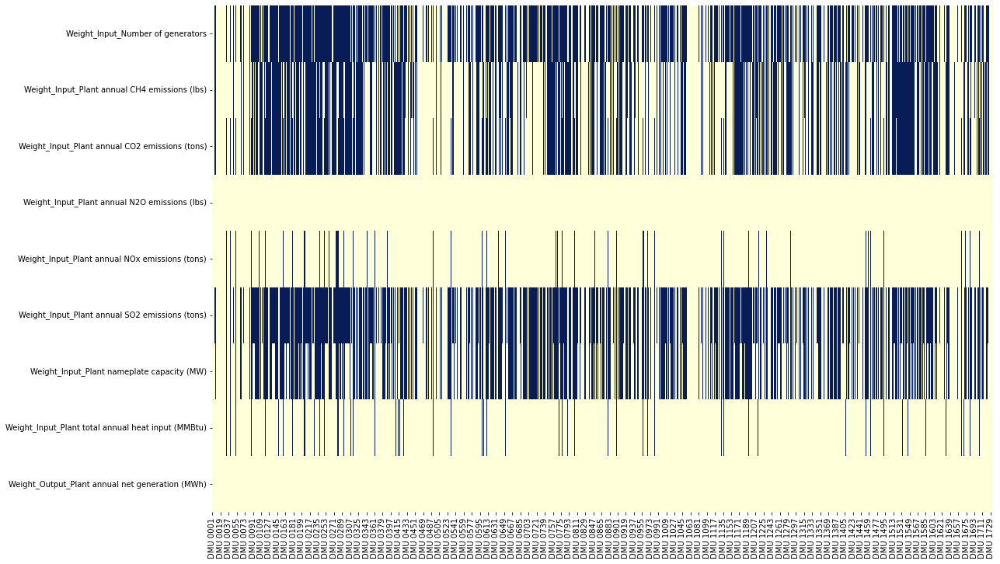

In [52]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_4.xlsx", i=i)

In [53]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.4594  0.4659 -0.0065     -1.4023            True
1        0.4642  0.4647 -0.0005     -0.1132            True
2        0.2234  0.2235 -0.0001     -0.0287            True
3        0.4752  0.4672  0.0080      1.7151            True
4        0.3671  0.4459 -0.0788    -17.6700           False
..          ...     ...     ...         ...             ...
342      0.2280  0.2224  0.0057      2.5419            True
343      0.2185  0.2227 -0.0042     -1.8974            True
344      0.2179  0.2229 -0.0050     -2.2608            True
345      0.4611  0.4648 -0.0038     -0.8071            True
346      0.2254  0.2235  0.0018      0.8172            True

[347 rows x 5 columns]
blue:  233
red:  114
rho: 0.8137
p-Value 0.0


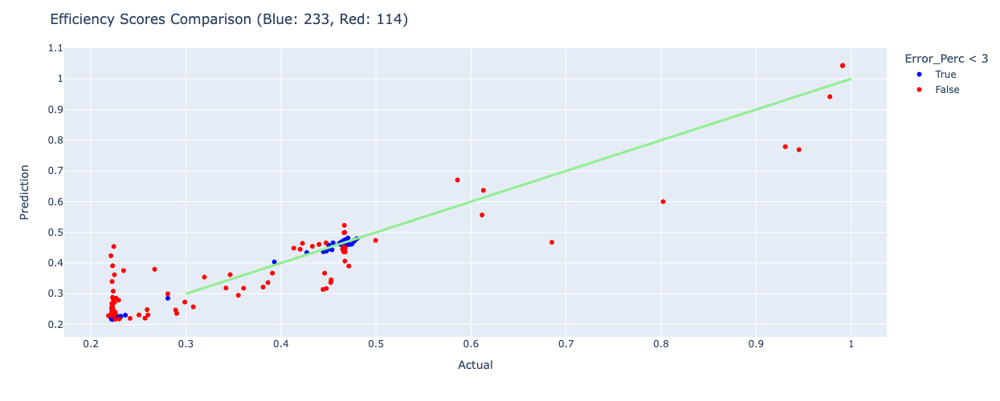

In [54]:
compareML(pipe_gb, y)

blue :  813
red :  920


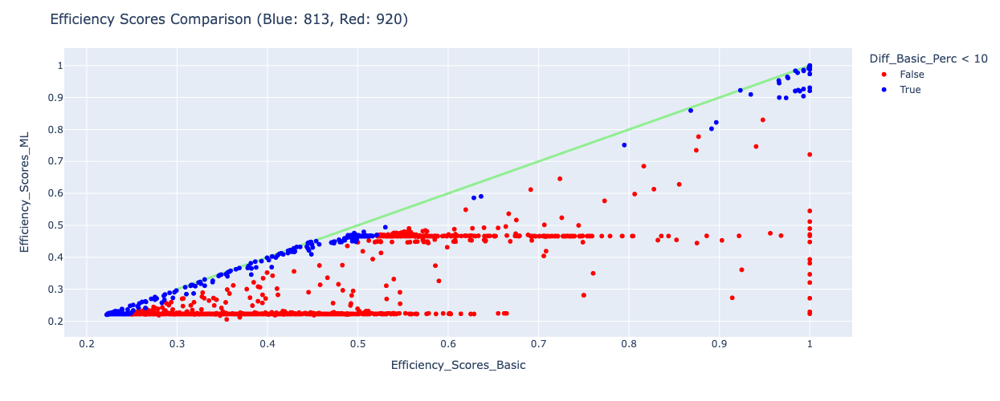

blue :  30
red :  1703


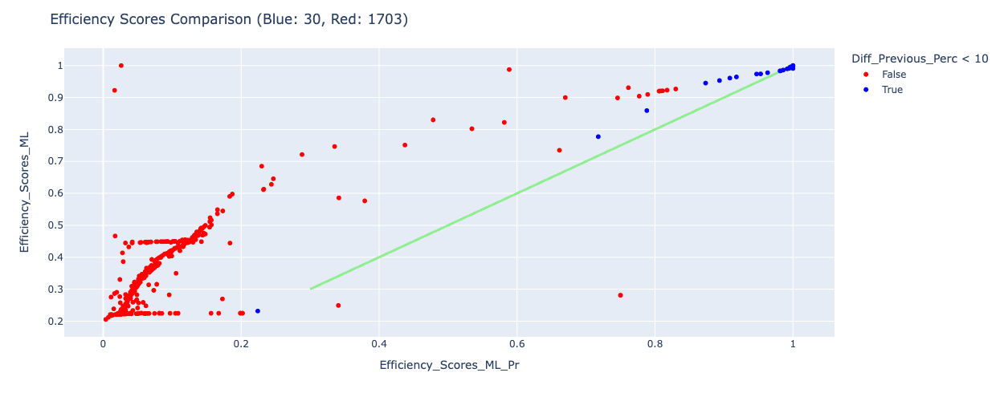

In [55]:
compareES(df_1_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_4.xlsx", df_0_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_3.xlsx")

### i = 5

In [56]:
i +=1

In [57]:
for r in results[-1:]:
    deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx",  folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     1065
Weight_Input_Plant annual CH4 emissions (lbs)          775
Weight_Input_Plant annual CO2 emissions (tons)         802
Weight_Input_Plant annual N2O emissions (lbs)            0
Weight_Input_Plant annual NOx emissions (tons)          86
Weight_Input_Plant annual SO2 emissions (tons)        1032
Weight_Input_Plant nameplate capacity (MW)             837
Weight_Input_Plant total annual heat input (MMBtu)      90
Weight_Output_Plant annual net generation (MWh)          0
dtype: int64
Total Zeros:  4687
neg_mean_squared_error: -0.003448888324919084
neg_root_mean_squared_error: -0.05694610296157806
r2: 0.8588070247731571
grid.best_score:  -0.05257791838945207
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientb

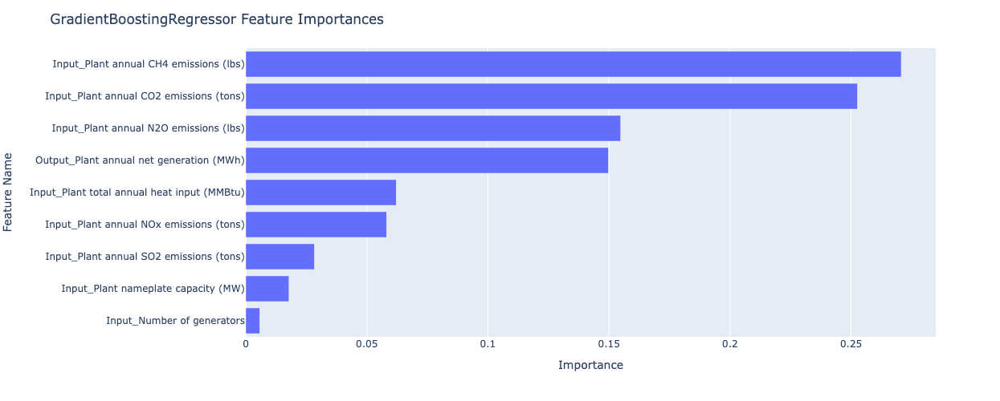

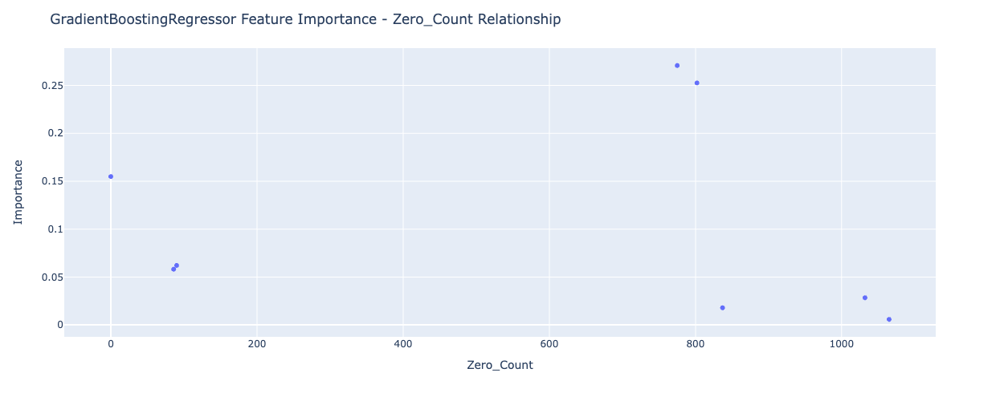

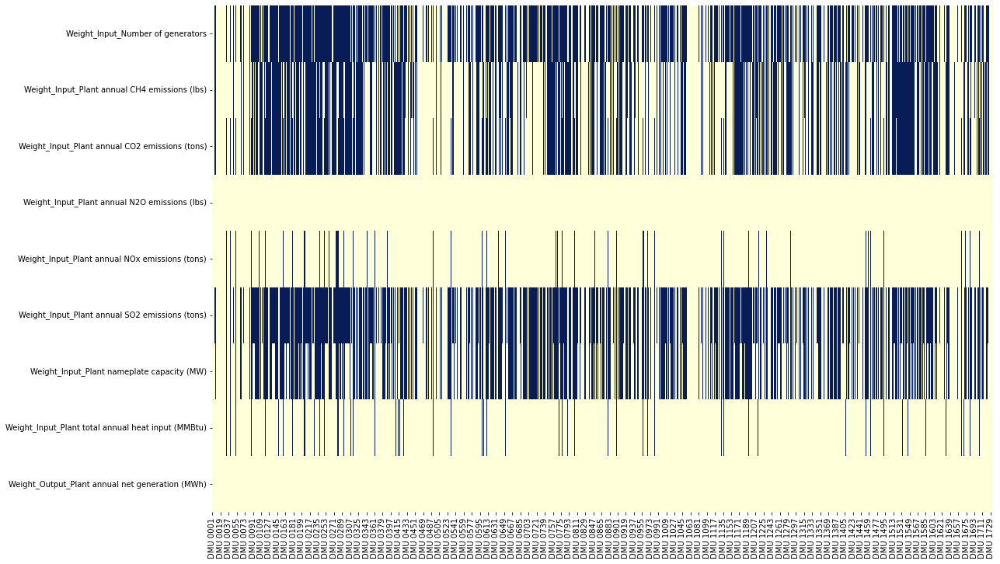

In [58]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_5.xlsx", i=i)
results.append(r)

In [59]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.4594  0.4659 -0.0065     -1.4023            True
1        0.4642  0.4647 -0.0005     -0.1132            True
2        0.2234  0.2235 -0.0001     -0.0287            True
3        0.4752  0.4672  0.0080      1.7151            True
4        0.3671  0.4459 -0.0788    -17.6700           False
..          ...     ...     ...         ...             ...
342      0.2280  0.2224  0.0057      2.5419            True
343      0.2185  0.2227 -0.0042     -1.8974            True
344      0.2179  0.2229 -0.0050     -2.2608            True
345      0.4611  0.4648 -0.0038     -0.8071            True
346      0.2254  0.2235  0.0018      0.8172            True

[347 rows x 5 columns]
blue:  233
red:  114
rho: 0.8137
p-Value 0.0


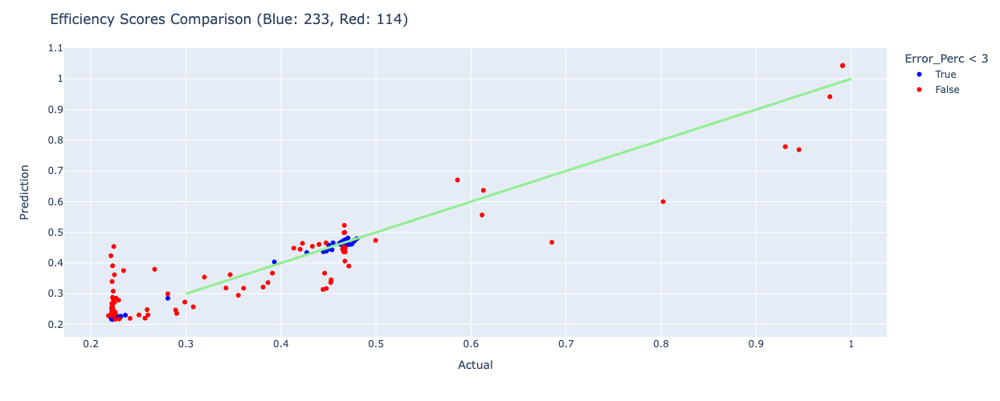

In [60]:
compareML(pipe_gb, y)

blue :  813
red :  920


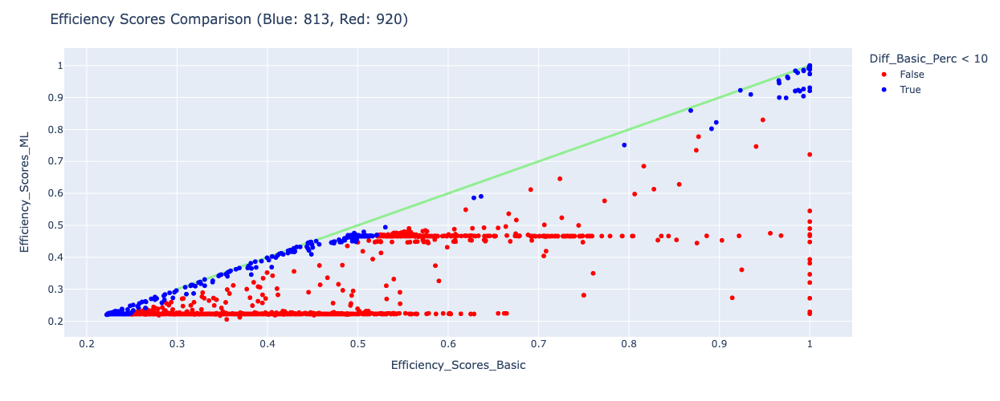

blue :  1733
red :  0


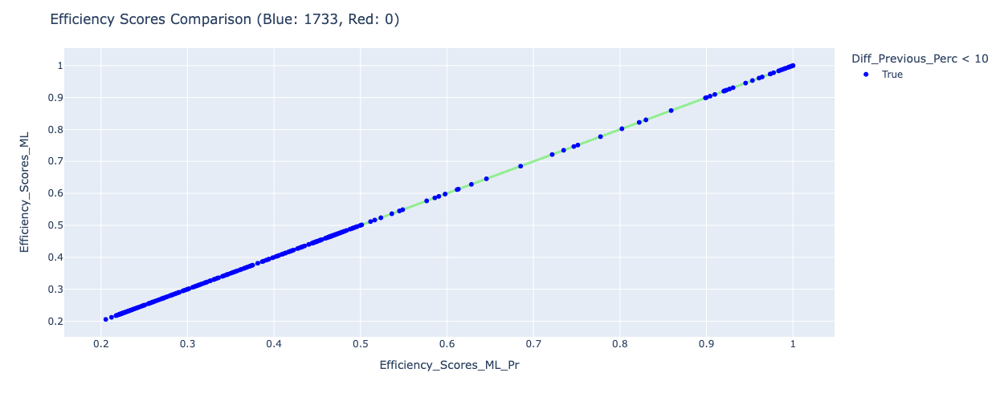

In [61]:
compareES(df_1_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_5.xlsx", df_0_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_4.xlsx")

### i = 6

In [62]:
i +=1

In [63]:
for r in results[-1:]:
    deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx",  folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     272
Weight_Input_Plant annual CH4 emissions (lbs)           0
Weight_Input_Plant annual CO2 emissions (tons)          1
Weight_Input_Plant annual N2O emissions (lbs)           2
Weight_Input_Plant annual NOx emissions (tons)        158
Weight_Input_Plant annual SO2 emissions (tons)        240
Weight_Input_Plant nameplate capacity (MW)            248
Weight_Input_Plant total annual heat input (MMBtu)     33
Weight_Output_Plant annual net generation (MWh)         0
dtype: int64
Total Zeros:  954
neg_mean_squared_error: -0.0031455056066251124
neg_root_mean_squared_error: -0.05385739073247721
r2: 0.8447878309298101
grid.best_score:  -0.05994533590296682
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingre

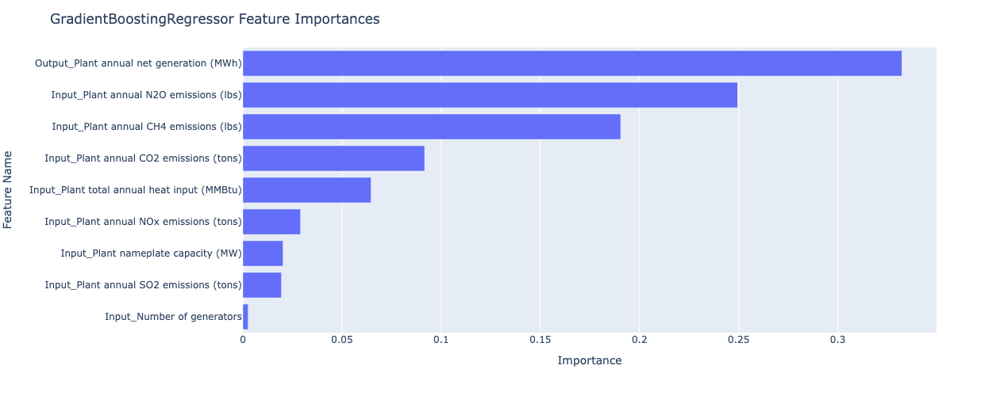

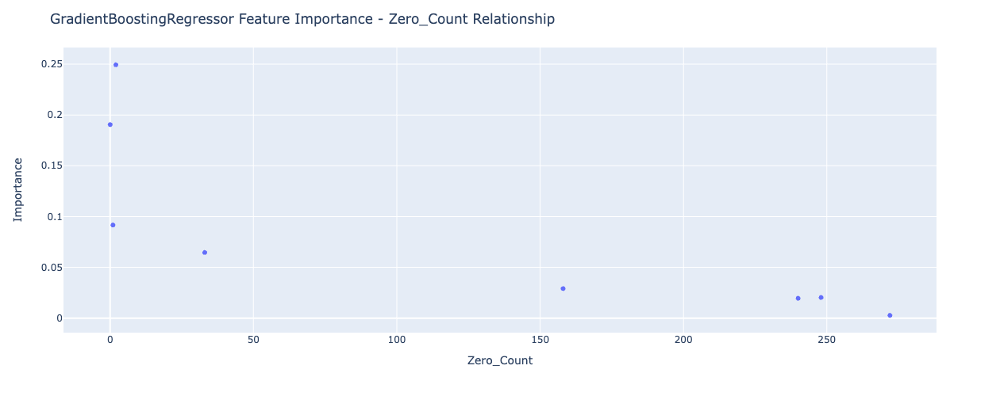

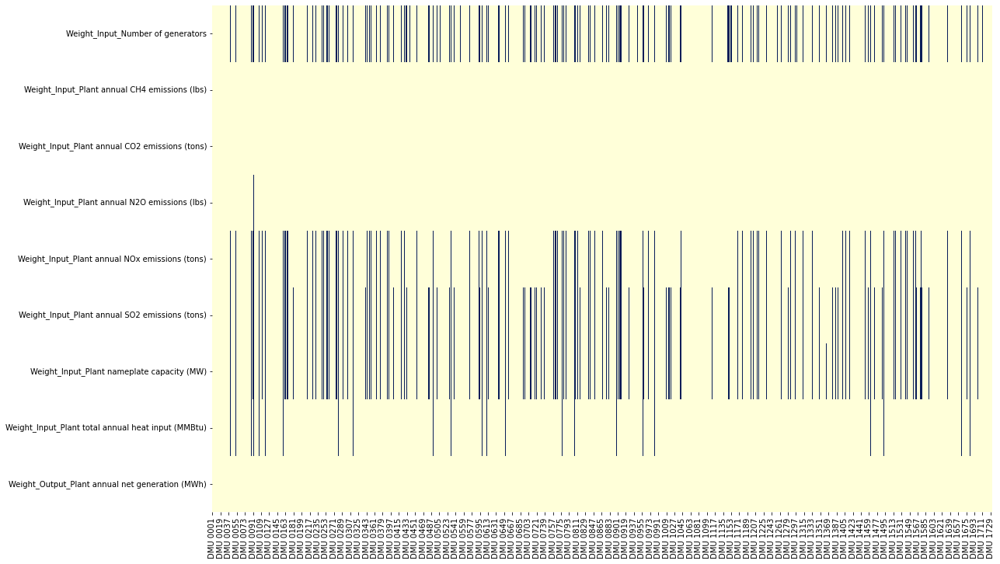

In [64]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_6.xlsx", i=i)
results.append(r)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.1268  0.1320 -0.0052     -3.9488           False
1        0.1282  0.1314 -0.0032     -2.4163            True
2        0.0286  0.0268  0.0018      6.7182           False
3        0.1244  0.1326 -0.0081     -6.1461           False
4        0.0725  0.0421  0.0305     72.4166           False
..          ...     ...     ...         ...             ...
342      0.0271  0.0264  0.0007      2.7182            True
343      0.0274  0.0411 -0.0137    -33.3713           False
344      0.0258  0.0298 -0.0040    -13.3932           False
345      0.1234  0.1313 -0.0079     -6.0263           False
346      0.0284  0.0344 -0.0059    -17.2880           False

[347 rows x 5 columns]
blue:  65
red:  282
rho: 0.805
p-Value 0.0


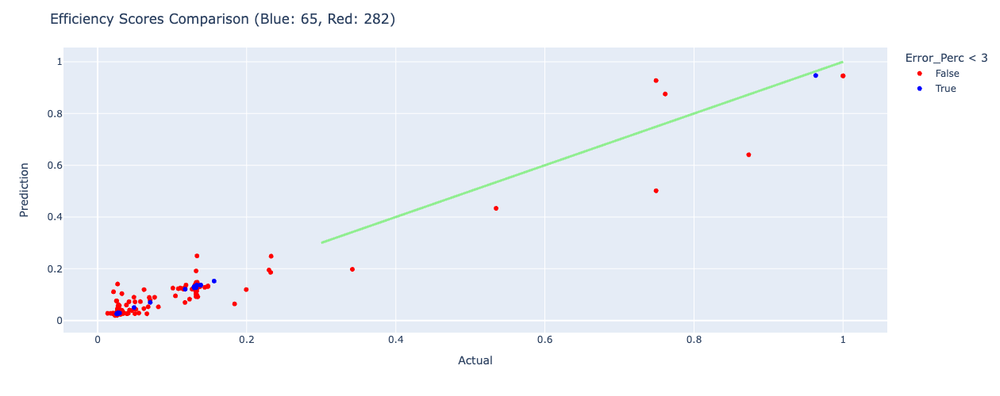

In [65]:
compareML(pipe_gb, y)

In [66]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

blue :  35
red :  1698


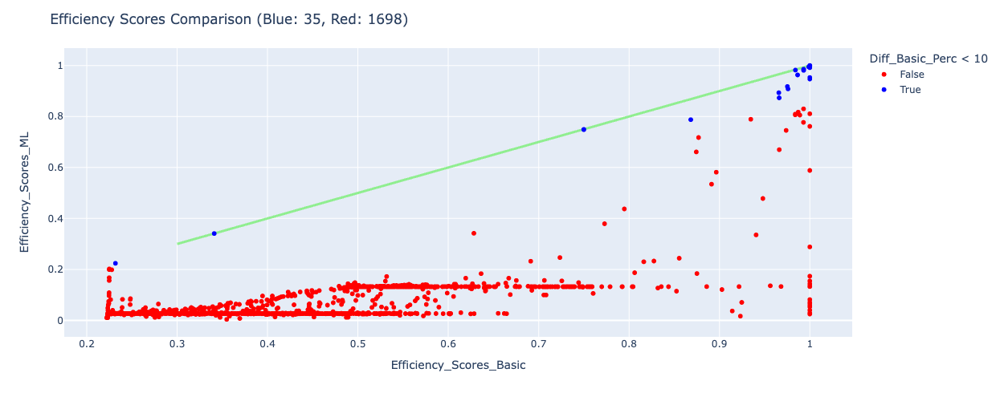

blue :  30
red :  1703


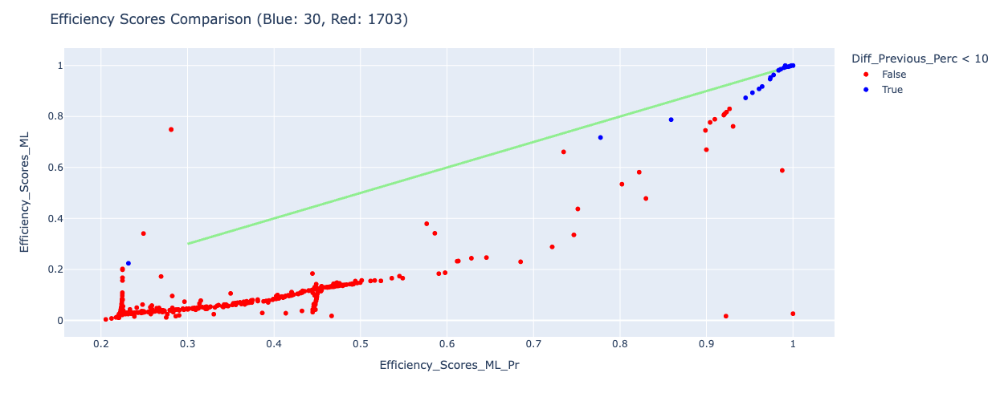

In [67]:
compareES(df_1_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_6.xlsx", df_0_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_5.xlsx")

### i = 7

In [68]:
i +=1

In [69]:
for r in results[-1:]:
    deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx",  folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     1065
Weight_Input_Plant annual CH4 emissions (lbs)          775
Weight_Input_Plant annual CO2 emissions (tons)         802
Weight_Input_Plant annual N2O emissions (lbs)            0
Weight_Input_Plant annual NOx emissions (tons)          86
Weight_Input_Plant annual SO2 emissions (tons)        1032
Weight_Input_Plant nameplate capacity (MW)             837
Weight_Input_Plant total annual heat input (MMBtu)      90
Weight_Output_Plant annual net generation (MWh)          0
dtype: int64
Total Zeros:  4687
neg_mean_squared_error: -0.003448888324919084
neg_root_mean_squared_error: -0.05694610296157806
r2: 0.8588070247731571
grid.best_score:  -0.05257791838945207
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientb

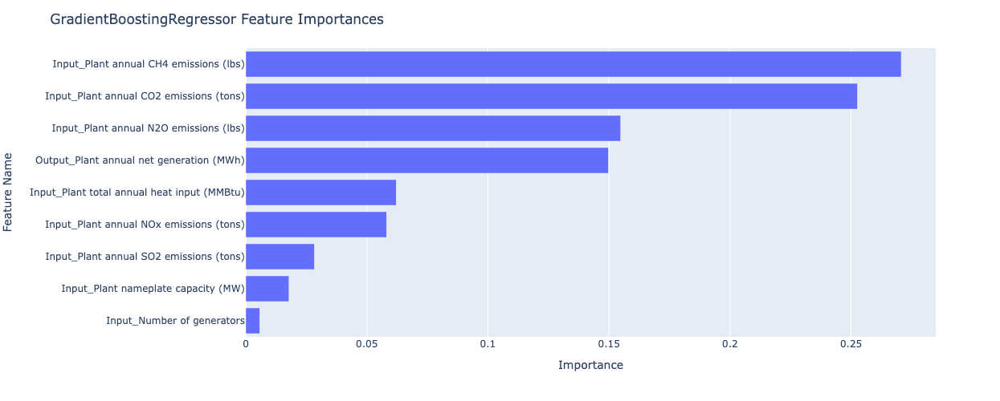

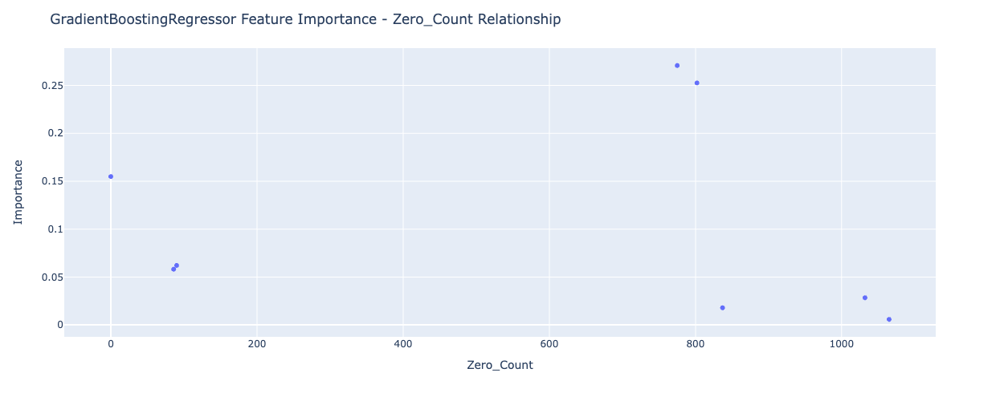

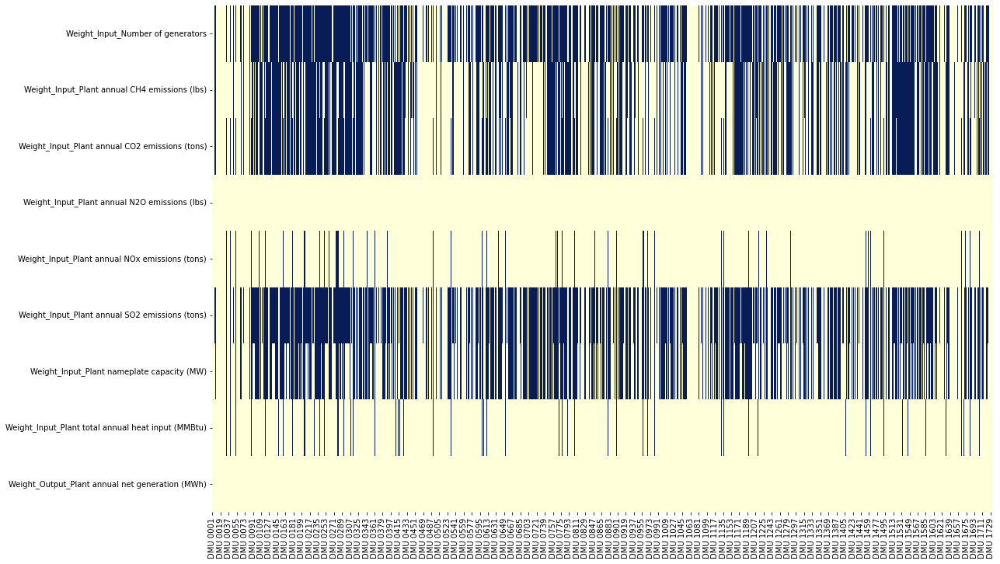

In [70]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_7.xlsx", i=i)
results.append(r)

In [71]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.4594  0.4659 -0.0065     -1.4023            True
1        0.4642  0.4647 -0.0005     -0.1132            True
2        0.2234  0.2235 -0.0001     -0.0287            True
3        0.4752  0.4672  0.0080      1.7151            True
4        0.3671  0.4459 -0.0788    -17.6700           False
..          ...     ...     ...         ...             ...
342      0.2280  0.2224  0.0057      2.5419            True
343      0.2185  0.2227 -0.0042     -1.8974            True
344      0.2179  0.2229 -0.0050     -2.2608            True
345      0.4611  0.4648 -0.0038     -0.8071            True
346      0.2254  0.2235  0.0018      0.8172            True

[347 rows x 5 columns]
blue:  233
red:  114
rho: 0.8137
p-Value 0.0


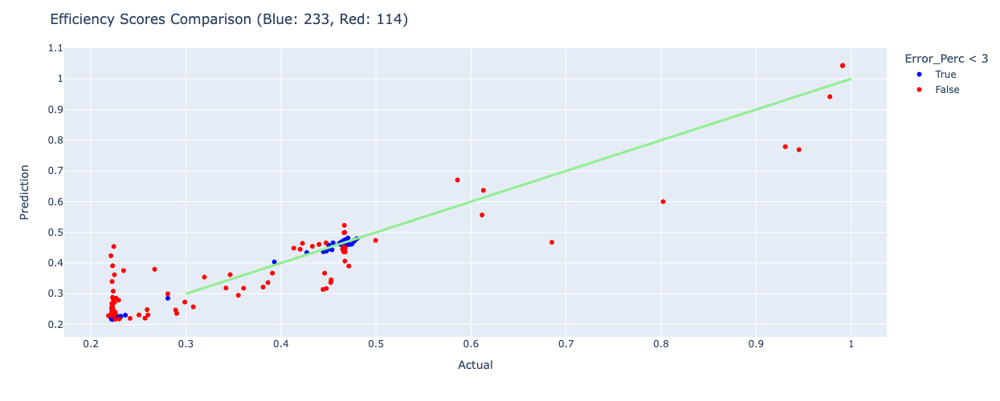

In [72]:
compareML(pipe_gb, y)

blue :  813
red :  920


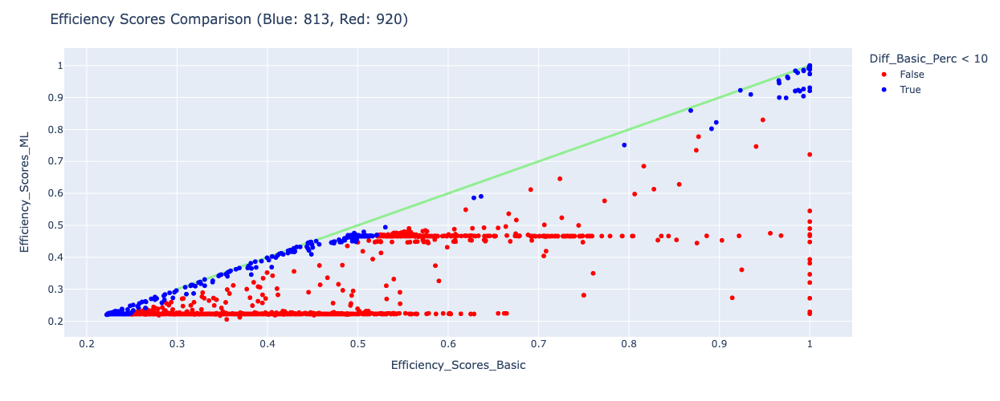

blue :  30
red :  1703


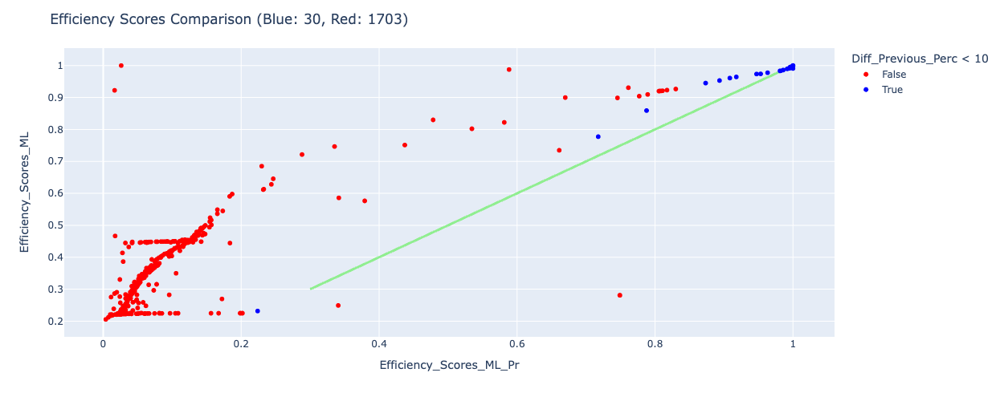

In [73]:
compareES(df_1_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_7.xlsx", df_0_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_6.xlsx")

### i = 8

In [74]:
i +=1

In [75]:
for r in results[-1:]:
    deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx",  folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     272
Weight_Input_Plant annual CH4 emissions (lbs)           0
Weight_Input_Plant annual CO2 emissions (tons)          1
Weight_Input_Plant annual N2O emissions (lbs)           2
Weight_Input_Plant annual NOx emissions (tons)        158
Weight_Input_Plant annual SO2 emissions (tons)        240
Weight_Input_Plant nameplate capacity (MW)            248
Weight_Input_Plant total annual heat input (MMBtu)     33
Weight_Output_Plant annual net generation (MWh)         0
dtype: int64
Total Zeros:  954
neg_mean_squared_error: -0.0031455056066251124
neg_root_mean_squared_error: -0.05385739073247721
r2: 0.8447878309298101
grid.best_score:  -0.05994533590296682
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingre

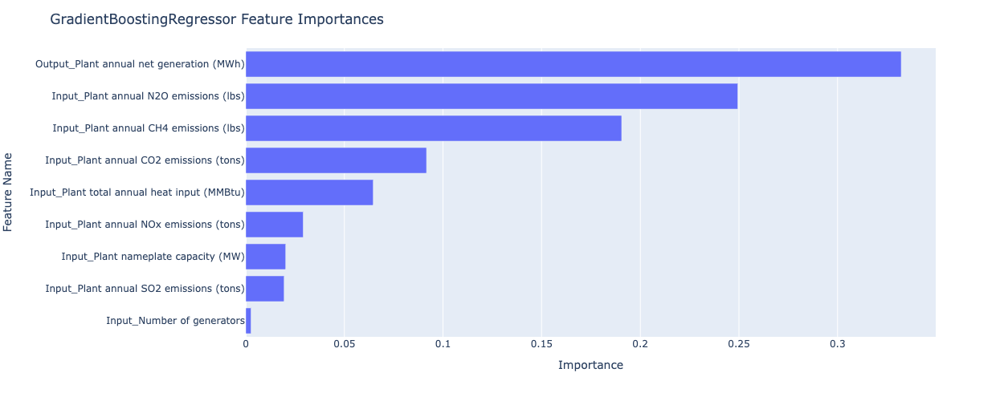

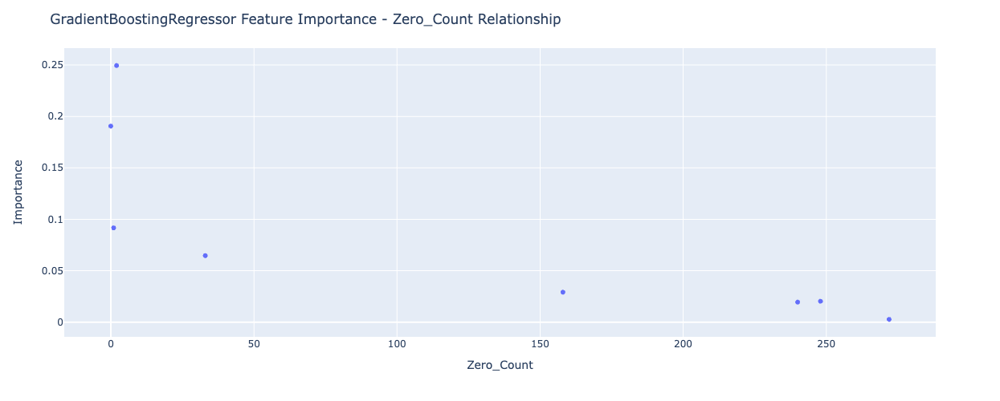

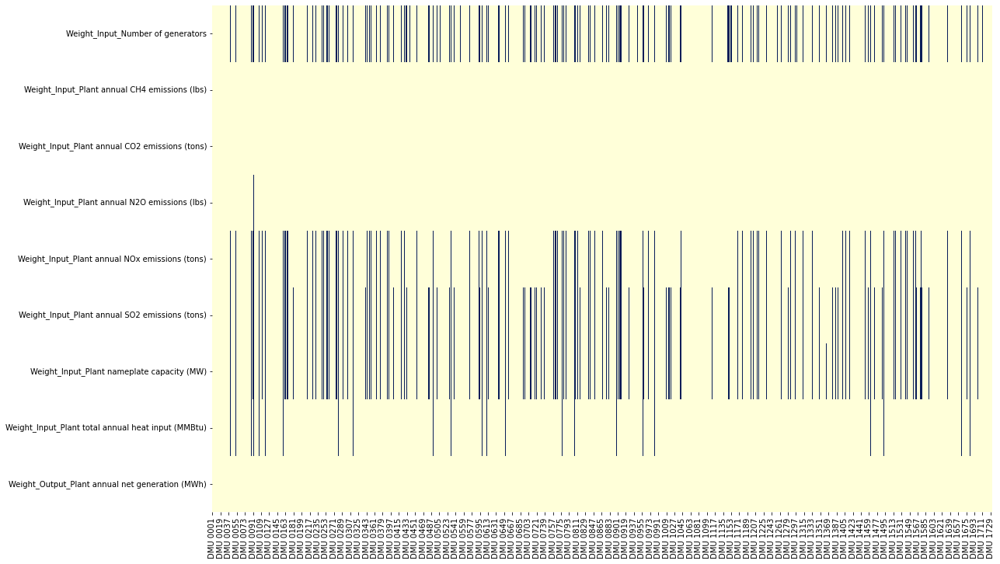

In [76]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_8.xlsx", i=i)
results.append(r)

In [77]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.1268  0.1320 -0.0052     -3.9488           False
1        0.1282  0.1314 -0.0032     -2.4163            True
2        0.0286  0.0268  0.0018      6.7182           False
3        0.1244  0.1326 -0.0081     -6.1461           False
4        0.0725  0.0421  0.0305     72.4166           False
..          ...     ...     ...         ...             ...
342      0.0271  0.0264  0.0007      2.7182            True
343      0.0274  0.0411 -0.0137    -33.3713           False
344      0.0258  0.0298 -0.0040    -13.3932           False
345      0.1234  0.1313 -0.0079     -6.0263           False
346      0.0284  0.0344 -0.0059    -17.2880           False

[347 rows x 5 columns]
blue:  65
red:  282
rho: 0.805
p-Value 0.0


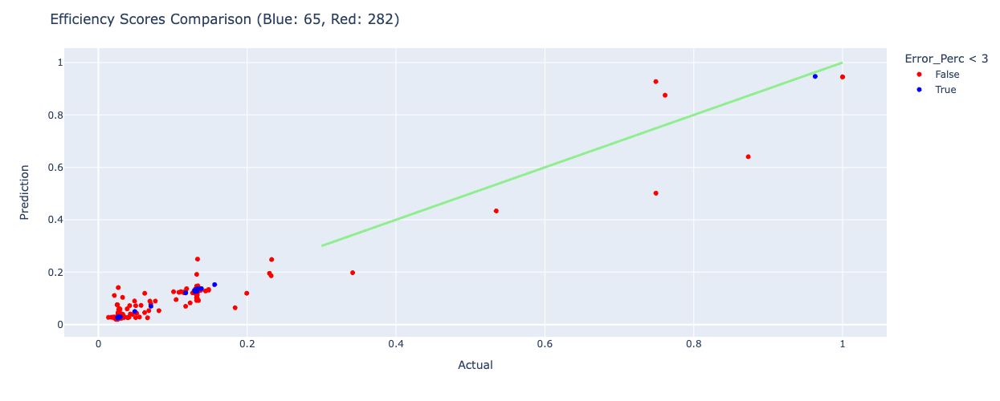

In [78]:
compareML(pipe_gb, y)

blue :  35
red :  1698


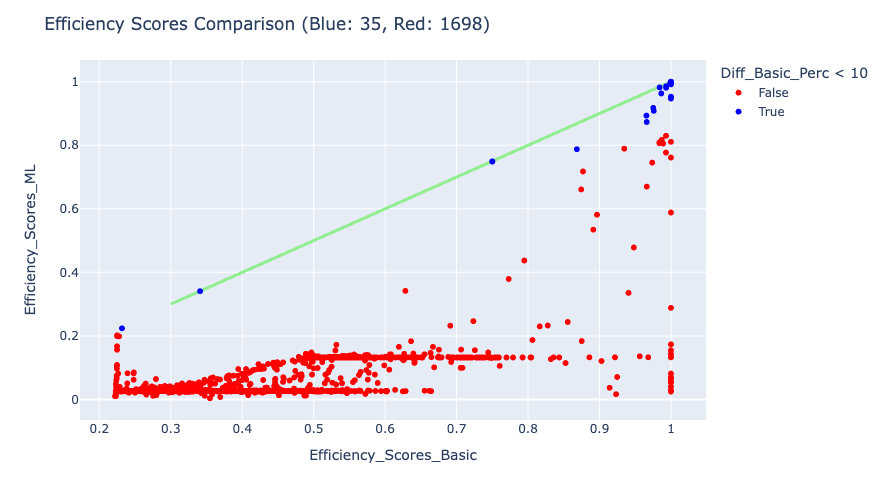

blue :  30
red :  1703


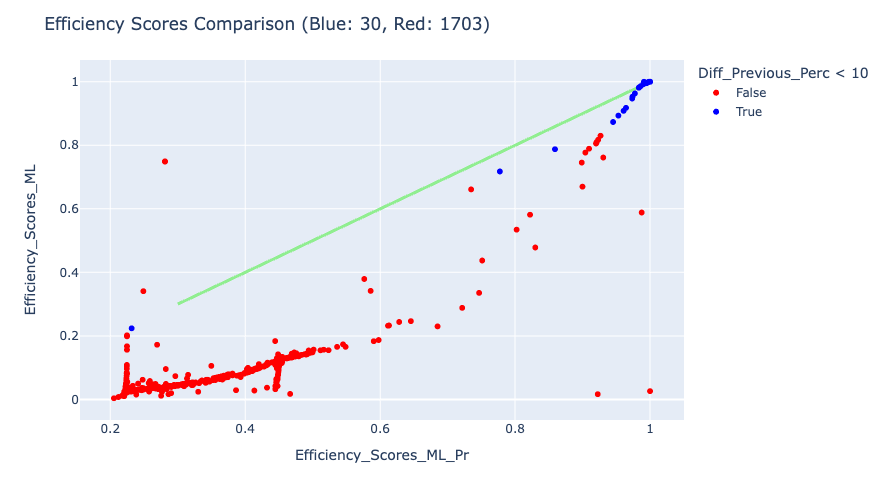

In [79]:
compareES(df_1_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_8.xlsx", df_0_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_7.xlsx")

### i = 9

In [80]:
i +=1

In [81]:
for r in results[-1:]:
    deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx",  folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     1065
Weight_Input_Plant annual CH4 emissions (lbs)          775
Weight_Input_Plant annual CO2 emissions (tons)         802
Weight_Input_Plant annual N2O emissions (lbs)            0
Weight_Input_Plant annual NOx emissions (tons)          86
Weight_Input_Plant annual SO2 emissions (tons)        1032
Weight_Input_Plant nameplate capacity (MW)             837
Weight_Input_Plant total annual heat input (MMBtu)      90
Weight_Output_Plant annual net generation (MWh)          0
dtype: int64
Total Zeros:  4687
neg_mean_squared_error: -0.003448888324919084
neg_root_mean_squared_error: -0.05694610296157806
r2: 0.8588070247731571
grid.best_score:  -0.05257791838945207
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientb

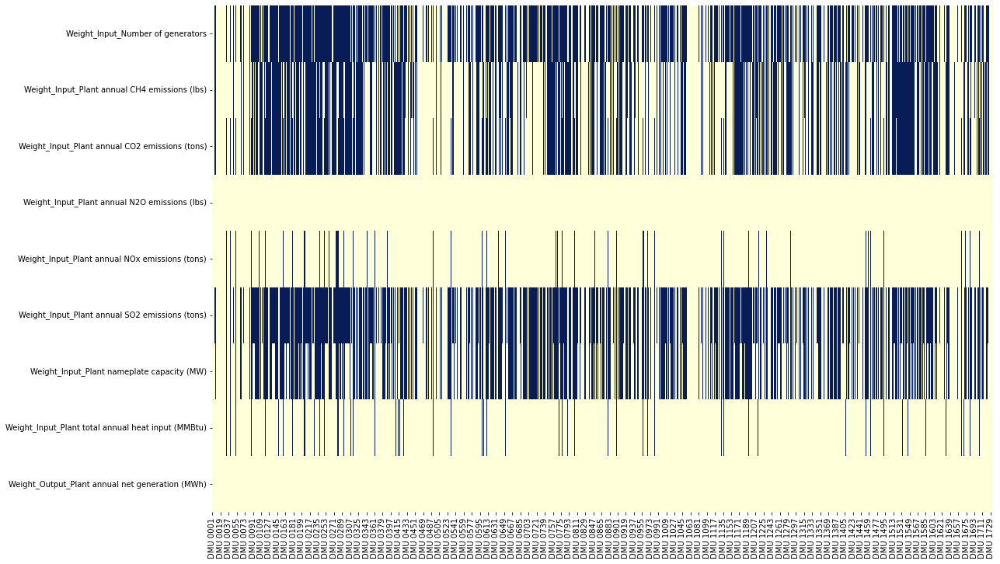

In [82]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_9.xlsx", i=i)
results.append(r)

In [83]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

In [84]:
compareML(pipe_gb, y)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.4594  0.4659 -0.0065     -1.4023            True
1        0.4642  0.4647 -0.0005     -0.1132            True
2        0.2234  0.2235 -0.0001     -0.0287            True
3        0.4752  0.4672  0.0080      1.7151            True
4        0.3671  0.4459 -0.0788    -17.6700           False
..          ...     ...     ...         ...             ...
342      0.2280  0.2224  0.0057      2.5419            True
343      0.2185  0.2227 -0.0042     -1.8974            True
344      0.2179  0.2229 -0.0050     -2.2608            True
345      0.4611  0.4648 -0.0038     -0.8071            True
346      0.2254  0.2235  0.0018      0.8172            True

[347 rows x 5 columns]
blue:  233
red:  114
rho: 0.8137
p-Value 0.0


In [85]:
compareES(df_1_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_9.xlsx", df_0_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_8.xlsx")

blue :  813
red :  920


blue :  30
red :  1703


### i = 10

In [86]:
i +=1

In [87]:
for r in results[-1:]:
    deasolver(inputfile="Data/RealData/Recurcive/egrid2020_data.xlsx",  folder = "Data/RealData/Recurcive/Second/", out_suffix1="_Sol_", out_suffix2=str(i), input_imp = r)

100.0
Solution file saved outputfile


df_zero: 
 Weight_Input_Number of generators                     272
Weight_Input_Plant annual CH4 emissions (lbs)           0
Weight_Input_Plant annual CO2 emissions (tons)          1
Weight_Input_Plant annual N2O emissions (lbs)           2
Weight_Input_Plant annual NOx emissions (tons)        158
Weight_Input_Plant annual SO2 emissions (tons)        240
Weight_Input_Plant nameplate capacity (MW)            248
Weight_Input_Plant total annual heat input (MMBtu)     33
Weight_Output_Plant annual net generation (MWh)         0
dtype: int64
Total Zeros:  954
neg_mean_squared_error: -0.0031455056066251124
neg_root_mean_squared_error: -0.05385739073247721
r2: 0.8447878309298101
grid.best_score:  -0.05994533590296682
grid.best_params:  {'gradientboostingregressor__subsample': 0.3, 'gradientboostingregressor__n_estimators': 500, 'gradientboostingregressor__min_samples_split': 30, 'gradientboostingregressor__min_samples_leaf': 2, 'gradientboostingregressor__max_depth': 5, 'gradientboostingre

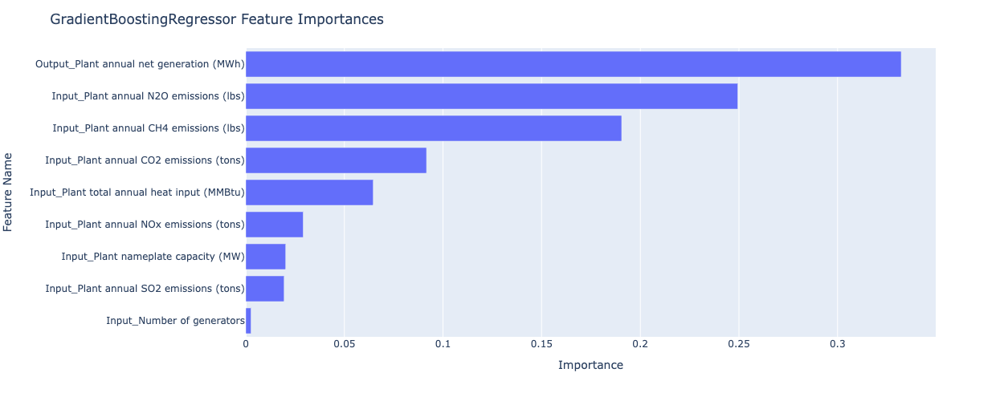

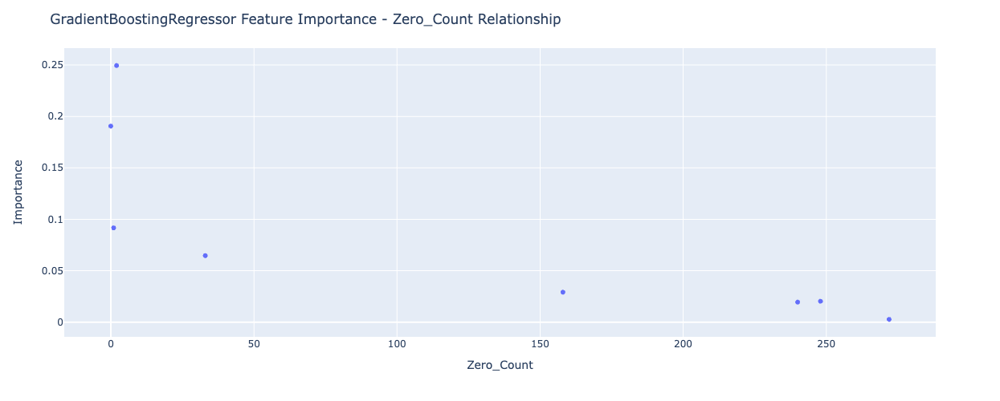

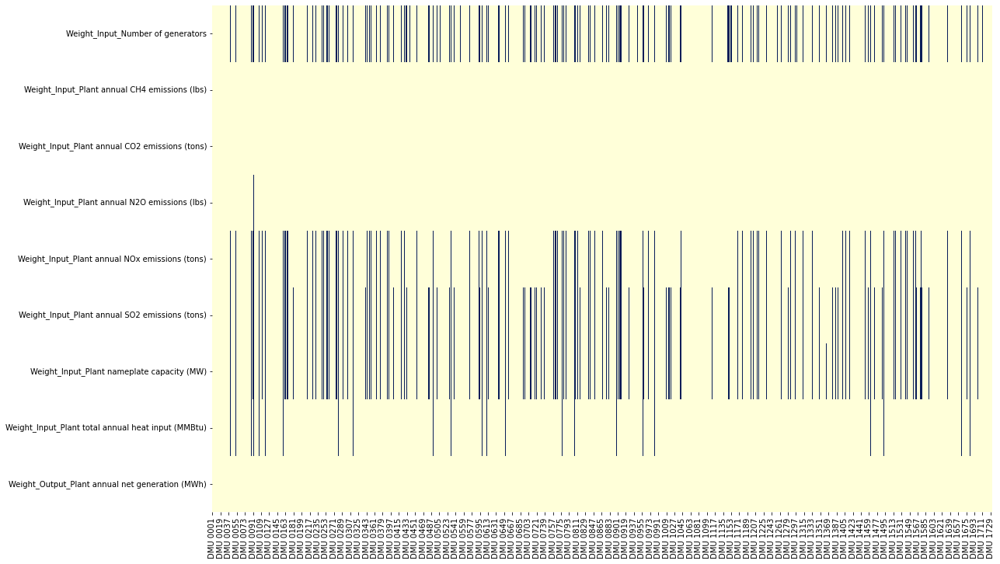

In [88]:
pipe_gb, r, y, df_merged = ml(sol_filepath="Data/RealData/Recurcive/Second/egrid2020_data_Sol_10.xlsx", i=i)

In [89]:
df_imp = pd.concat([df_imp, df_merged], ignore_index=True)

res:       Prediction  Actual    Diff  Error_Perc  Error_Perc < 3
0        0.1268  0.1320 -0.0052     -3.9488           False
1        0.1282  0.1314 -0.0032     -2.4163            True
2        0.0286  0.0268  0.0018      6.7182           False
3        0.1244  0.1326 -0.0081     -6.1461           False
4        0.0725  0.0421  0.0305     72.4166           False
..          ...     ...     ...         ...             ...
342      0.0271  0.0264  0.0007      2.7182            True
343      0.0274  0.0411 -0.0137    -33.3713           False
344      0.0258  0.0298 -0.0040    -13.3932           False
345      0.1234  0.1313 -0.0079     -6.0263           False
346      0.0284  0.0344 -0.0059    -17.2880           False

[347 rows x 5 columns]
blue:  65
red:  282
rho: 0.805
p-Value 0.0


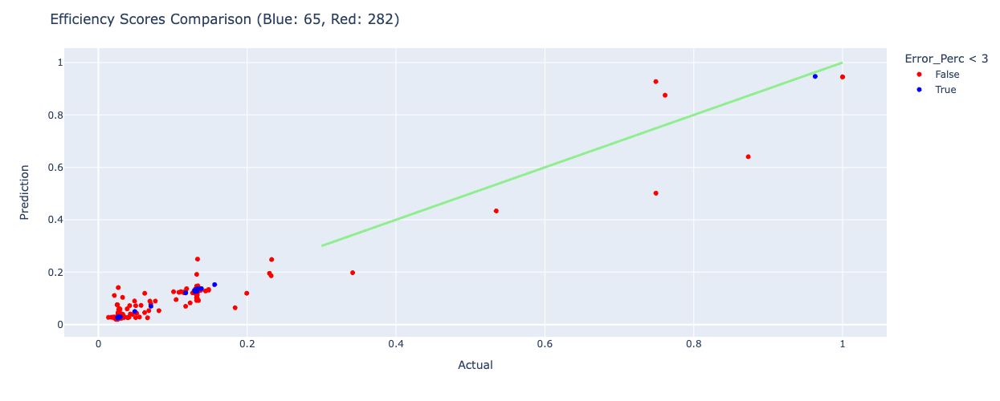

In [90]:
compareML(pipe_gb, y)

blue :  35
red :  1698


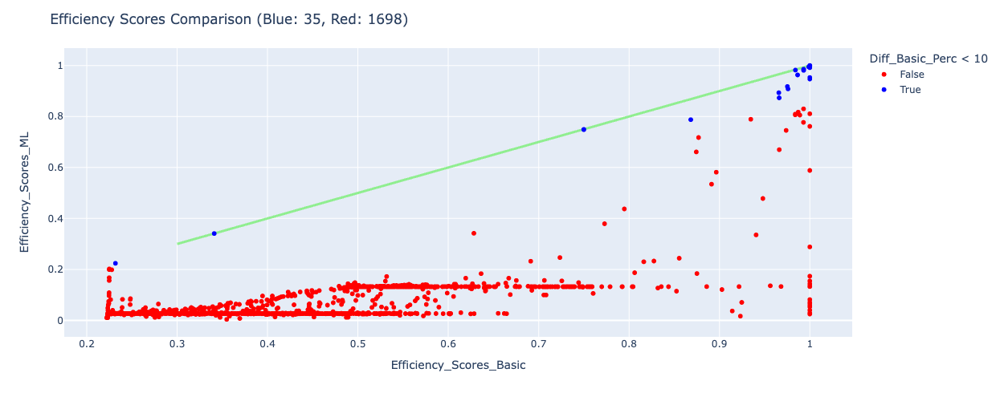

blue :  30
red :  1703


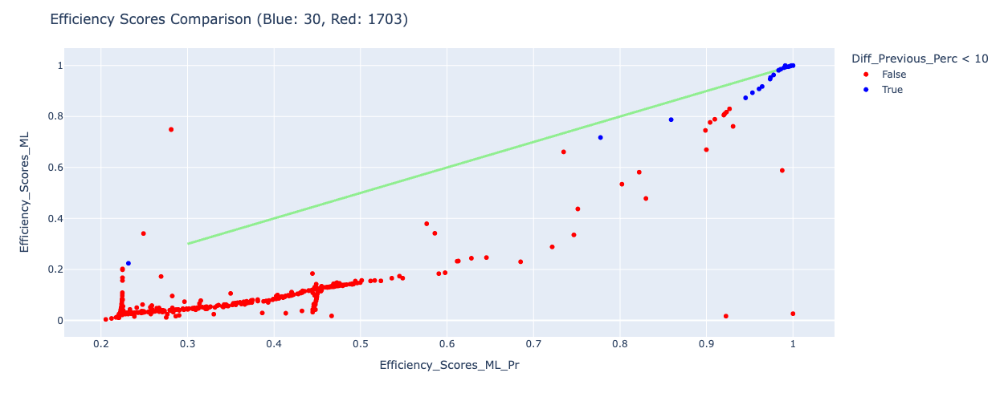

In [91]:
compareES(df_1_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_10.xlsx", df_0_path="Data/RealData/Recurcive/Second/egrid2020_data_Sol_9.xlsx")

In [94]:
with open("Data/RealData/Recurcive/Second/egrid2020.pkl", 'wb') as f:
    pickle.dump(results, f)

In [101]:
with open('Data/RealData/Recurcive/Second/egrid2020.pkl', 'rb') as f:
    r = pickle.load(f)

In [95]:
df_imp.to_pickle('Data/RealData/Recurcive/Second/egrid2020_df_imp.pkl')